# EDA

## Data cleaning before analysis

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [3]:
footfall = pd.read_csv('FootfallFinal.csv')

footfall.head()

,Date,AdmissionsAD,AdmissionsCH,EducationAD,EducationCH,FamilyAD,FamilyCH,TicketFOCAD,TicketFOCCH,MembersAD,MembersCH,Day Total,Cumulative0,Last Year,Under 3's,Difference
0,2017/1/1,130,22,0,0,20,20,6,4,172,74,448,31703,"22,520",NaN,"9,183"
1,2017/1/2,334,90,3,8,84,84,37,2,630,338,1610,33313,"23,356",NaN,"9,957"
2,2017/1/3,162,46,23,72,30,30,17,7,320,203,910,34223,"23,847",NaN,"10,376"
3,2017/1/4,100,18,12,26,4,4,7,2,124,39,336,34559,"24,368",NaN,"10,191"
4,2017/1/5,97,6,19,107,6,6,9,0,210,37,497,35056,"24,630",NaN,"10,426"


In [4]:
footfall.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2191 entries, 0 to 2190
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          2191 non-null   object 
 1   AdmissionsAD  2191 non-null   object 
 2   AdmissionsCH  2191 non-null   int64  
 3   EducationAD   2191 non-null   int64  
 4   EducationCH   2191 non-null   int64  
 5   FamilyAD      2191 non-null   int64  
 6   FamilyCH      2191 non-null   int64  
 7   TicketFOCAD   2191 non-null   int64  
 8   TicketFOCCH   2191 non-null   int64  
 9   MembersAD     2191 non-null   int64  
 10  MembersCH     2191 non-null   int64  
 11  Day Total     2191 non-null   object 
 12  Cumulative0   2191 non-null   object 
 13  Last Year     2191 non-null   object 
 14  Under 3's     4 non-null      float64
 15  Difference    2191 non-null   object 
dtypes: float64(1), int64(9), object(6)
memory usage: 274.0+ KB


In [5]:
footfall = footfall.drop("Difference", axis=1)

In [6]:
footfall = footfall.replace(' - ', np.nan)

# Convert object columns to float or int
float_columns = ['AdmissionsAD', 'Day Total', 'Cumulative0', 'Last Year']
int_columns = ['AdmissionsCH', 'EducationAD', 'EducationCH', 'FamilyAD', 'FamilyCH', 'TicketFOCAD', 'TicketFOCCH', 'MembersAD', 'MembersCH']
footfall[float_columns] = footfall[float_columns].apply(lambda x: x.str.replace(',', '')).astype(float)
footfall[int_columns] = footfall[int_columns].astype(int)

print(footfall.dtypes)

Date             object
AdmissionsAD    float64
AdmissionsCH      int64
EducationAD       int64
EducationCH       int64
FamilyAD          int64
FamilyCH          int64
TicketFOCAD       int64
TicketFOCCH       int64
MembersAD         int64
MembersCH         int64
Day Total       float64
Cumulative0     float64
Last Year       float64
Under 3's       float64
dtype: object


In [7]:
footfall['Date'] = pd.to_datetime(footfall['Date'], format='%Y/%m/%d')

print(footfall.dtypes)


Date            datetime64[ns]
AdmissionsAD           float64
AdmissionsCH             int64
EducationAD              int64
EducationCH              int64
FamilyAD                 int64
FamilyCH                 int64
TicketFOCAD              int64
TicketFOCCH              int64
MembersAD                int64
MembersCH                int64
Day Total              float64
Cumulative0            float64
Last Year              float64
Under 3's              float64
dtype: object


In [8]:
weather = pd.read_csv('WeatherFinal.csv')

weather.head()

,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
0,2017/1/1,8.4,3.4,6.2,5.1,-2.5,2.2,5.3,93.7,7.550,...,0,57.6,36.2,322.4,1018.3,84.8,17.5,11.6,1.1,1
1,2017/1/2,5.0,-0.5,2.5,1.1,-3.4,-1.6,0.0,83.2,0.724,...,0,NaN,28.6,35.5,1029.2,44.0,21.0,53.3,4.6,3
2,2017/1/3,5.7,-1.0,2.4,3.3,-3.4,-0.2,0.2,85.4,0.074,...,0,NaN,19.3,299.6,1031.1,42.8,29.0,57.6,5.0,3
3,2017/1/4,7.1,4.3,5.6,5.1,0.1,2.7,3.3,85.1,0.000,...,0,NaN,23.3,314.7,1028.6,92.6,31.3,44.5,3.8,2
4,2017/1/5,5.9,2.2,3.8,3.1,-1.1,0.9,0.3,78.1,0.022,...,0,NaN,14.3,100.8,1033.8,79.8,24.6,48.2,4.1,2


In [9]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2191 entries, 0 to 2190
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   datetime          2191 non-null   object 
 1   tempmax           2191 non-null   float64
 2   tempmin           2191 non-null   float64
 3   temp              2191 non-null   float64
 4   feelslikemax      2191 non-null   float64
 5   feelslikemin      2191 non-null   float64
 6   feelslike         2191 non-null   float64
 7   dew               2191 non-null   float64
 8   humidity          2191 non-null   float64
 9   precip            2191 non-null   float64
 10  precipprob        2191 non-null   int64  
 11  precipcover       2191 non-null   float64
 12  preciptype        1727 non-null   object 
 13  snow              2191 non-null   int64  
 14  snowdepth         2191 non-null   int64  
 15  windgust          1154 non-null   float64
 16  windspeed         2191 non-null   float64


In [10]:
weather['datetime'] = pd.to_datetime(weather['datetime'], format='%Y/%m/%d')
print(weather.dtypes)

datetime            datetime64[ns]
tempmax                    float64
tempmin                    float64
temp                       float64
feelslikemax               float64
feelslikemin               float64
feelslike                  float64
dew                        float64
humidity                   float64
precip                     float64
precipprob                   int64
precipcover                float64
preciptype                  object
snow                         int64
snowdepth                    int64
windgust                   float64
windspeed                  float64
winddir                    float64
sealevelpressure           float64
cloudcover                 float64
visibility                 float64
solarradiation             float64
solarenergy                float64
uvindex                      int64
dtype: object


In [11]:
# Merge the two data frames
merged = pd.merge(footfall, weather, left_on='Date', right_on='datetime')
merged.head()

,Date,AdmissionsAD,AdmissionsCH,EducationAD,EducationCH,FamilyAD,FamilyCH,TicketFOCAD,TicketFOCCH,MembersAD,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
0,2017-01-01,130.0,22,0,0,20,20,6,4,172,...,0,57.6,36.2,322.4,1018.3,84.8,17.5,11.6,1.1,1
1,2017-01-02,334.0,90,3,8,84,84,37,2,630,...,0,NaN,28.6,35.5,1029.2,44.0,21.0,53.3,4.6,3
2,2017-01-03,162.0,46,23,72,30,30,17,7,320,...,0,NaN,19.3,299.6,1031.1,42.8,29.0,57.6,5.0,3
3,2017-01-04,100.0,18,12,26,4,4,7,2,124,...,0,NaN,23.3,314.7,1028.6,92.6,31.3,44.5,3.8,2
4,2017-01-05,97.0,6,19,107,6,6,9,0,210,...,0,NaN,14.3,100.8,1033.8,79.8,24.6,48.2,4.1,2


In [12]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2191 entries, 0 to 2190
Data columns (total 39 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              2191 non-null   datetime64[ns]
 1   AdmissionsAD      2191 non-null   float64       
 2   AdmissionsCH      2191 non-null   int64         
 3   EducationAD       2191 non-null   int64         
 4   EducationCH       2191 non-null   int64         
 5   FamilyAD          2191 non-null   int64         
 6   FamilyCH          2191 non-null   int64         
 7   TicketFOCAD       2191 non-null   int64         
 8   TicketFOCCH       2191 non-null   int64         
 9   MembersAD         2191 non-null   int64         
 10  MembersCH         2191 non-null   int64         
 11  Day Total         2190 non-null   float64       
 12  Cumulative0       2191 non-null   float64       
 13  Last Year         2191 non-null   float64       
 14  Under 3's         4 non-

The next stage is to 1) extract the more significant factors from the weather data and 2) extract the more significant data from the visitor footfall tables; these factors will be analysed and compared respectively in order to obtain some useful information.

#### Factors that are more important/relevant

In [13]:
# Merge the footfall and weather data
merged1 = pd.merge(footfall[['Date', 'Day Total']], weather, left_on='Date', right_on='datetime')

# Calculate the correlation
correlations = merged1.corr()['Day Total'].sort_values(ascending=False)

print(correlations)


Day Total           1.000000
solarenergy         0.456627
temp                0.442795
feelslikemin        0.442687
feelslike           0.442573
uvindex             0.439447
tempmin             0.420310
solarradiation      0.406231
dew                 0.400723
tempmax             0.360078
feelslikemax        0.355933
sealevelpressure    0.136530
visibility          0.129730
winddir             0.071081
cloudcover         -0.071277
precipprob         -0.092152
humidity           -0.102522
precipcover        -0.143946
precip             -0.207470
windgust           -0.226841
windspeed          -0.265284
snow                     NaN
snowdepth                NaN
Name: Day Total, dtype: float64


/tmp/ipykernel_131358/2599147106.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlations = merged1.corr()['Day Total'].sort_values(ascending=False)


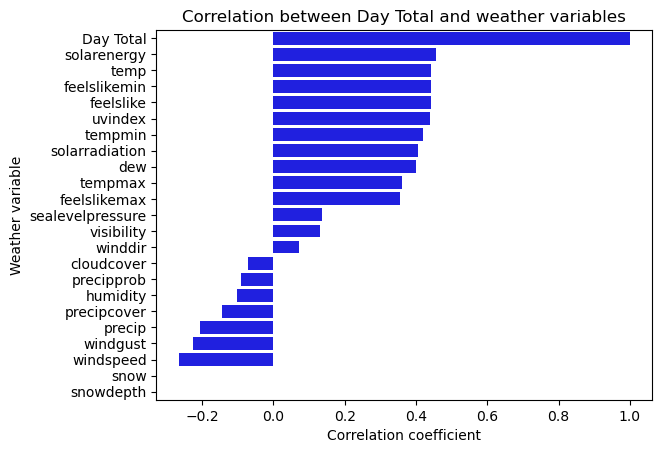

In [14]:
sns.barplot(x=correlations.values, y=correlations.index, color='blue')
plt.title('Correlation between Day Total and weather variables')
plt.xlabel('Correlation coefficient')
plt.ylabel('Weather variable')
plt.show()

In [15]:
#drop factors with threshold < 0.4 or <-0.4
weather1 = weather.drop(['dew', 'tempmax', 'feelslikemax', 'sealevelpressure', 'visibility', 'winddir', 'cloudcover', 'precipprob', 'humidity', 'precipcover', 'precip', 'windgust', 'windspeed','snow','snowdepth','preciptype'], axis=1)

In [16]:
weather1.head()

,datetime,tempmin,temp,feelslikemin,feelslike,solarradiation,solarenergy,uvindex
0,2017-01-01,3.4,6.2,-2.5,2.2,11.6,1.1,1
1,2017-01-02,-0.5,2.5,-3.4,-1.6,53.3,4.6,3
2,2017-01-03,-1.0,2.4,-3.4,-0.2,57.6,5.0,3
3,2017-01-04,4.3,5.6,0.1,2.7,44.5,3.8,2
4,2017-01-05,2.2,3.8,-1.1,0.9,48.2,4.1,2


## 1. Overall Analysis

In [17]:
footfall['Date'] = pd.to_datetime(footfall['Date'])
footfall.set_index('Date', inplace=True)

In [18]:
# Resample the data to monthly frequency and calculate the mean
footfall_monthly = footfall['Day Total'].resample('M').mean()
footfall_monthly.head()

Date
2017-01-31     570.290323
2017-02-28     992.250000
2017-03-31     818.129032
2017-04-30    2012.533333
2017-05-31    1399.129032
Freq: M, Name: Day Total, dtype: float64

In [19]:
footfall_monthly.index

DatetimeIndex(['2017-01-31', '2017-02-28', '2017-03-31', '2017-04-30',
               '2017-05-31', '2017-06-30', '2017-07-31', '2017-08-31',
               '2017-09-30', '2017-10-31', '2017-11-30', '2017-12-31',
               '2018-01-31', '2018-02-28', '2018-03-31', '2018-04-30',
               '2018-05-31', '2018-06-30', '2018-07-31', '2018-08-31',
               '2018-09-30', '2018-10-31', '2018-11-30', '2018-12-31',
               '2019-01-31', '2019-02-28', '2019-03-31', '2019-04-30',
               '2019-05-31', '2019-06-30', '2019-07-31', '2019-08-31',
               '2019-09-30', '2019-10-31', '2019-11-30', '2019-12-31',
               '2020-01-31', '2020-02-29', '2020-03-31', '2020-04-30',
               '2020-05-31', '2020-06-30', '2020-07-31', '2020-08-31',
               '2020-09-30', '2020-10-31', '2020-11-30', '2020-12-31',
               '2021-01-31', '2021-02-28', '2021-03-31', '2021-04-30',
               '2021-05-31', '2021-06-30', '2021-07-31', '2021-08-31',
      

<AxesSubplot:title={'center':'Monthly Footfall at Paignton Zoo'}, xlabel='Date'>

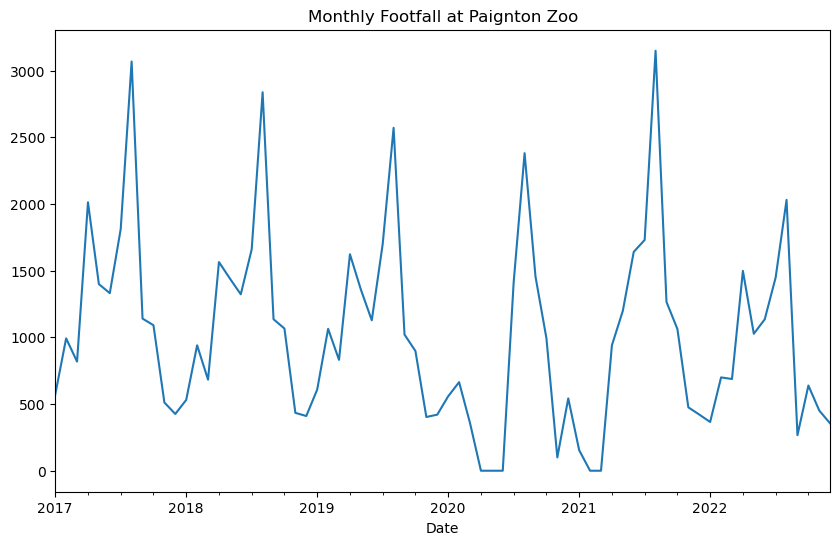

In [20]:
# Plot the monthly footfall time series
footfall_monthly.plot(figsize=(10, 6), title='Monthly Footfall at Paignton Zoo')

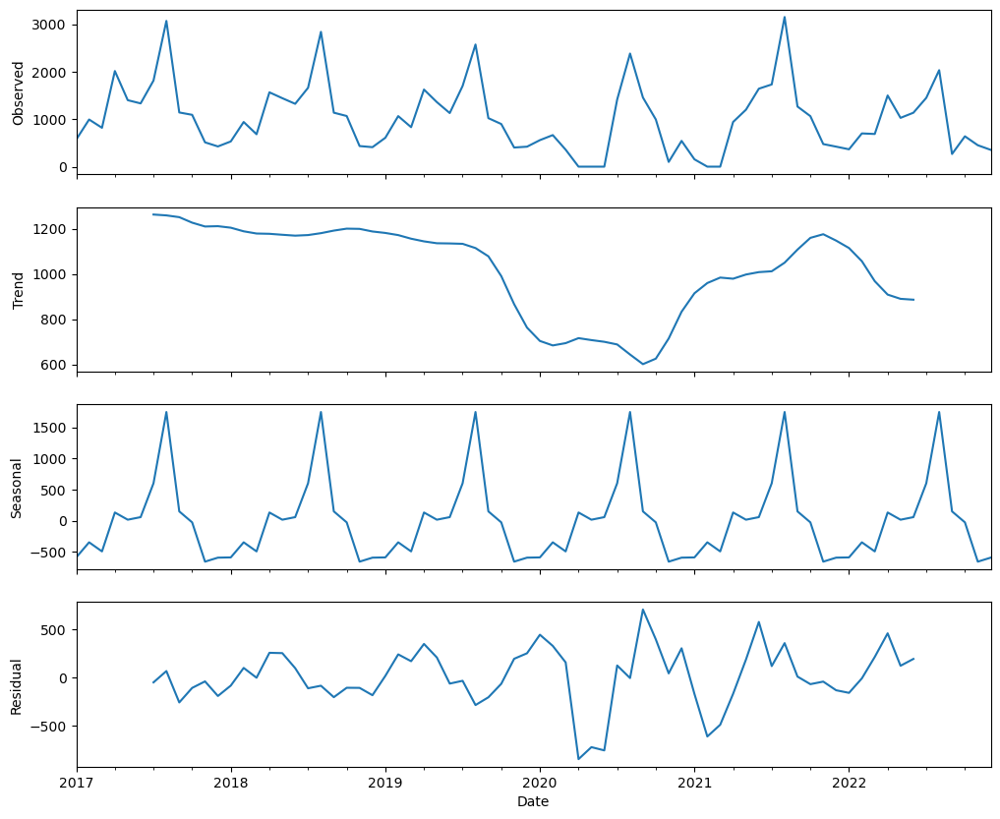

In [21]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Decompose the monthly footfall time series into trend, seasonal, and residual components
decomposition = seasonal_decompose(footfall_monthly, model='additive')

fig, axes = plt.subplots(4, 1, figsize=(12, 10), sharex=True)
decomposition.observed.plot(ax=axes[0], legend=False)
axes[0].set_ylabel('Observed')
decomposition.trend.plot(ax=axes[1], legend=False)
axes[1].set_ylabel('Trend')
decomposition.seasonal.plot(ax=axes[2], legend=False)
axes[2].set_ylabel('Seasonal')
decomposition.resid.plot(ax=axes[3], legend=False)
axes[3].set_ylabel('Residual')
plt.show()


Based on the graph above, we can see that the data is highly seasonal, therefore add a binary variable (1 for the peak time and 0 for the rest of the day) and see if can still capture it.

In [22]:
peak_indexs = footfall_monthly.groupby(footfall_monthly.index.year).idxmax()
peak_indexs

Date
2017   2017-08-31
2018   2018-08-31
2019   2019-08-31
2020   2020-08-31
2021   2021-08-31
2022   2022-08-31
Name: Day Total, dtype: datetime64[ns]

In [23]:
peak_months = peak_indexs.dt.month
peak_months

Date
2017    8
2018    8
2019    8
2020    8
2021    8
2022    8
Name: Day Total, dtype: int64

In [24]:
merged['peak month'] = merged['Date'].dt.month.apply(lambda x: 1 if x in peak_months.values else 0)
merged.head()

,Date,AdmissionsAD,AdmissionsCH,EducationAD,EducationCH,FamilyAD,FamilyCH,TicketFOCAD,TicketFOCCH,MembersAD,...,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,peak month
0,2017-01-01,130.0,22,0,0,20,20,6,4,172,...,57.6,36.2,322.4,1018.3,84.8,17.5,11.6,1.1,1,0
1,2017-01-02,334.0,90,3,8,84,84,37,2,630,...,NaN,28.6,35.5,1029.2,44.0,21.0,53.3,4.6,3,0
2,2017-01-03,162.0,46,23,72,30,30,17,7,320,...,NaN,19.3,299.6,1031.1,42.8,29.0,57.6,5.0,3,0
3,2017-01-04,100.0,18,12,26,4,4,7,2,124,...,NaN,23.3,314.7,1028.6,92.6,31.3,44.5,3.8,2,0
4,2017-01-05,97.0,6,19,107,6,6,9,0,210,...,NaN,14.3,100.8,1033.8,79.8,24.6,48.2,4.1,2,0


In [25]:
merged['peak month'].value_counts()

0    2005
1     186
Name: peak month, dtype: int64

In [26]:
footfall_monthly = footfall['Day Total'].resample('M').mean()
#drop the peak month
footfall_monthly = footfall_monthly.drop(footfall_monthly[footfall_monthly.index.month.isin(peak_months.values)].index)
footfall_monthly.head()

Date
2017-01-31     570.290323
2017-02-28     992.250000
2017-03-31     818.129032
2017-04-30    2012.533333
2017-05-31    1399.129032
Name: Day Total, dtype: float64

<AxesSubplot:title={'center':'Monthly Footfall at Paignton Zoo'}, xlabel='Date'>

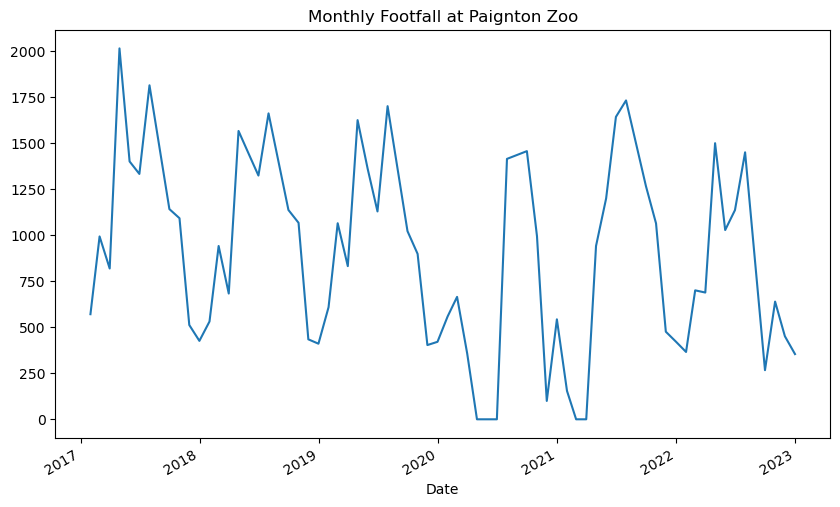

In [27]:
footfall_monthly.plot(figsize=(10, 6), title='Monthly Footfall at Paignton Zoo')

still have seasonality after exclude the peak month

/tmp/ipykernel_131358/4056185649.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  skew_data = merged.skew()


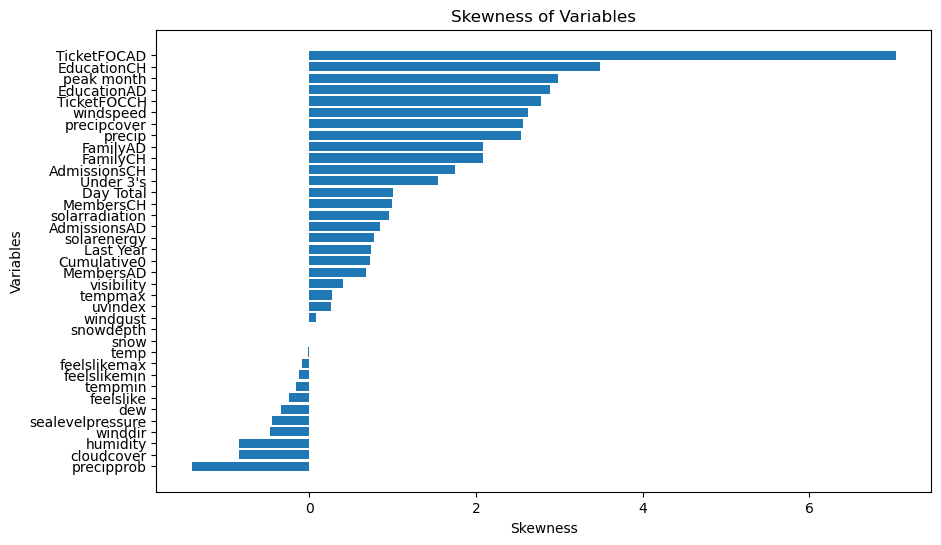

TicketFOCAD         7.040183
EducationCH         3.484822
peak month          2.980688
EducationAD         2.883154
TicketFOCCH         2.782439
windspeed           2.623173
precipcover         2.561523
precip              2.539435
FamilyAD            2.085723
FamilyCH            2.085723
AdmissionsCH        1.742395
Under 3's           1.547578
Day Total           1.000025
MembersCH           0.993904
solarradiation      0.959224
AdmissionsAD        0.852032
solarenergy         0.779300
Last Year           0.736506
Cumulative0         0.730801
MembersAD           0.685226
visibility          0.408277
tempmax             0.274729
uvindex             0.259281
windgust            0.079280
snowdepth           0.000000
snow                0.000000
temp               -0.013331
feelslikemax       -0.091910
feelslikemin       -0.121662
tempmin            -0.156213
feelslike          -0.238402
dew                -0.337981
sealevelpressure   -0.450592
winddir            -0.475095
humidity      

In [28]:
skew_data = merged.skew()
skew_data = skew_data.sort_values(ascending=False)
plt.figure(figsize=(10, 6))
plt.barh(skew_data.index, skew_data)

plt.title('Skewness of Variables')
plt.xlabel('Skewness')
plt.ylabel('Variables')

plt.gca().invert_yaxis()

plt.show()
print(skew_data)

/tmp/ipykernel_131358/2751406410.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  weather_skew = weather1.skew()


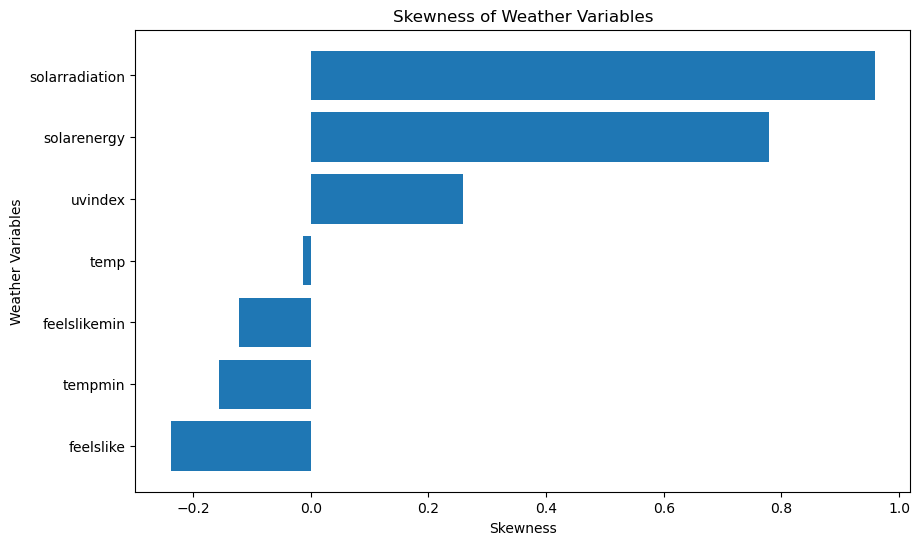

solarradiation    0.959224
solarenergy       0.779300
uvindex           0.259281
temp             -0.013331
feelslikemin     -0.121662
tempmin          -0.156213
feelslike        -0.238402
dtype: float64


In [29]:
weather_skew = weather1.skew()
weather_skew = weather_skew.sort_values(ascending=False)
plt.figure(figsize=(10, 6))
plt.barh(weather_skew.index, weather_skew)
plt.title('Skewness of Weather Variables')
plt.xlabel('Skewness')
plt.ylabel('Weather Variables')
plt.gca().invert_yaxis()
plt.show()
print(weather_skew)

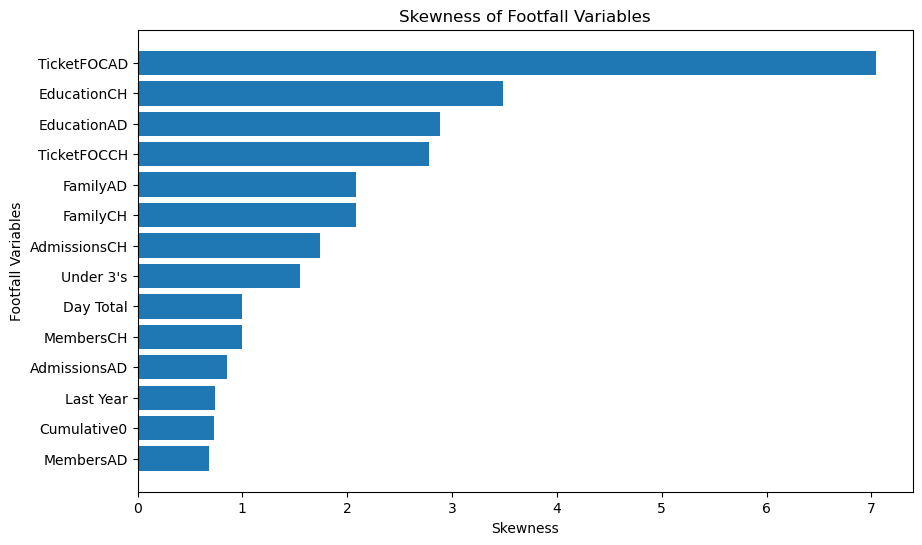

TicketFOCAD     7.040183
EducationCH     3.484822
EducationAD     2.883154
TicketFOCCH     2.782439
FamilyAD        2.085723
FamilyCH        2.085723
AdmissionsCH    1.742395
Under 3's       1.547578
Day Total       1.000025
MembersCH       0.993904
AdmissionsAD    0.852032
Last Year       0.736506
Cumulative0     0.730801
MembersAD       0.685226
dtype: float64


In [30]:
footfall_skew = footfall.skew()
footfall_skew = footfall_skew.sort_values(ascending=False)
plt.figure(figsize=(10, 6))
plt.barh(footfall_skew.index, footfall_skew)
plt.title('Skewness of Footfall Variables')
plt.xlabel('Skewness')
plt.ylabel('Footfall Variables')
plt.gca().invert_yaxis()
plt.show()
print(footfall_skew)

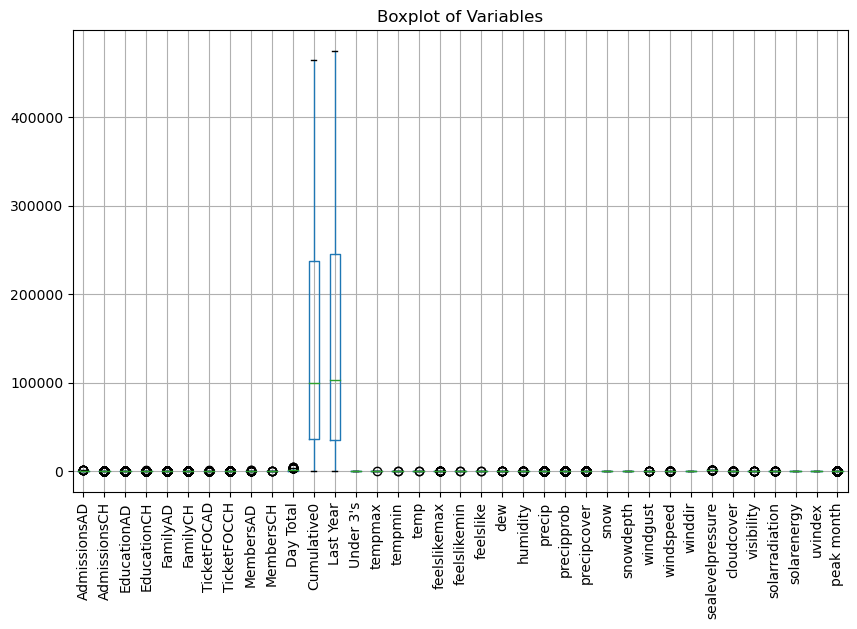

In [31]:
# Plot the boxplot
outlier_analysis_data = merged.copy()
outlier_analysis_data.boxplot(figsize=(10, 6))
plt.title('Boxplot of Variables')
plt.xticks(rotation=90)
plt.show()


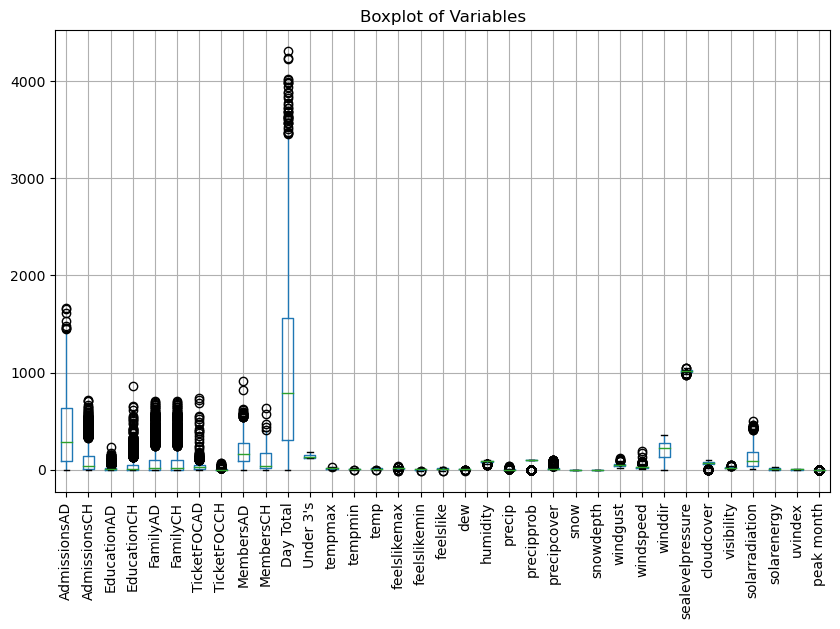

In [32]:
outlier_analysis_data = outlier_analysis_data.drop(['Cumulative0', 'Last Year'], axis=1)
outlier_analysis_data.boxplot(figsize=(10, 6))
plt.title('Boxplot of Variables')
plt.xticks(rotation=90)
plt.show()

In [33]:
outlier_analysis_data = outlier_analysis_data.drop(['Date', 'datetime'], axis=1)

In [34]:
outlier_analysis_data.isna().sum()

AdmissionsAD           0
AdmissionsCH           0
EducationAD            0
EducationCH            0
FamilyAD               0
FamilyCH               0
TicketFOCAD            0
TicketFOCCH            0
MembersAD              0
MembersCH              0
Day Total              1
Under 3's           2187
tempmax                0
tempmin                0
temp                   0
feelslikemax           0
feelslikemin           0
feelslike              0
dew                    0
humidity               0
precip                 0
precipprob             0
precipcover            0
preciptype           464
snow                   0
snowdepth              0
windgust            1037
windspeed              0
winddir                0
sealevelpressure       0
cloudcover             0
visibility             0
solarradiation         0
solarenergy            0
uvindex                0
peak month             0
dtype: int64

In [35]:
out_info = outlier_analysis_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2191 entries, 0 to 2190
Data columns (total 36 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   AdmissionsAD      2191 non-null   float64
 1   AdmissionsCH      2191 non-null   int64  
 2   EducationAD       2191 non-null   int64  
 3   EducationCH       2191 non-null   int64  
 4   FamilyAD          2191 non-null   int64  
 5   FamilyCH          2191 non-null   int64  
 6   TicketFOCAD       2191 non-null   int64  
 7   TicketFOCCH       2191 non-null   int64  
 8   MembersAD         2191 non-null   int64  
 9   MembersCH         2191 non-null   int64  
 10  Day Total         2190 non-null   float64
 11  Under 3's         4 non-null      float64
 12  tempmax           2191 non-null   float64
 13  tempmin           2191 non-null   float64
 14  temp              2191 non-null   float64
 15  feelslikemax      2191 non-null   float64
 16  feelslikemin      2191 non-null   float64


In [36]:
outlier_analysis_data = outlier_analysis_data.drop(["Under 3's"],axis=1)
outlier_analysis_data['windgust'] = outlier_analysis_data['windgust'].fillna(0)
outlier_analysis_data['windgust'] = outlier_analysis_data['windgust'].replace(np.nan, 0)
outlier_analysis_data['preciptype'] = outlier_analysis_data['preciptype'].fillna(0)
outlier_analysis_data['preciptype'] = outlier_analysis_data['preciptype'].replace('rain',1)
outlier_analysis_data['preciptype'] = outlier_analysis_data['preciptype'].replace('snow',2)
outlier_analysis_data['preciptype'] = outlier_analysis_data['preciptype'].replace('rain,snow',3)
outlier_analysis_data.isna().sum()

AdmissionsAD        0
AdmissionsCH        0
EducationAD         0
EducationCH         0
FamilyAD            0
FamilyCH            0
TicketFOCAD         0
TicketFOCCH         0
MembersAD           0
MembersCH           0
Day Total           1
tempmax             0
tempmin             0
temp                0
feelslikemax        0
feelslikemin        0
feelslike           0
dew                 0
humidity            0
precip              0
precipprob          0
precipcover         0
preciptype          0
snow                0
snowdepth           0
windgust            0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
peak month          0
dtype: int64

In [37]:
def detect_outliers_iqr(data, threshold):
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    iqr = q3 - q1
    lower_threshold = q1 - threshold * iqr
    upper_threshold = q3 + threshold * iqr
    outliers = (data < lower_threshold) | (data > upper_threshold)
    return outliers

In [38]:
for col in outlier_analysis_data.columns:
    if col != 'Day Total':
        outliers = detect_outliers_iqr(outlier_analysis_data[col], 2.5)
        print(col, ':', outliers.sum())
        

AdmissionsAD : 0
AdmissionsCH : 82
EducationAD : 74
EducationCH : 122
FamilyAD : 172
FamilyCH : 172
TicketFOCAD : 27
TicketFOCCH : 101
MembersAD : 2
MembersCH : 2
tempmax : 0
tempmin : 0
temp : 0
feelslikemax : 0
feelslikemin : 0
feelslike : 0
dew : 0
humidity : 2
precip : 103
precipprob : 464
precipcover : 135
preciptype : 520
snow : 0
snowdepth : 0
windgust : 0
windspeed : 12
winddir : 0
sealevelpressure : 0
cloudcover : 0
visibility : 0
solarradiation : 0
solarenergy : 0
uvindex : 0
peak month : 186


In [39]:
outlier_analysis_data['Day Visitor'] = outlier_analysis_data['AdmissionsAD'] + outlier_analysis_data['AdmissionsCH']+outlier_analysis_data['EducationAD']+outlier_analysis_data['EducationCH']+outlier_analysis_data['FamilyAD']+outlier_analysis_data['FamilyCH']+outlier_analysis_data['TicketFOCAD']+outlier_analysis_data['TicketFOCCH']
outlier_analysis_data['Day Visitor'] = outlier_analysis_data['Day Visitor'].astype(int)
outlier_analysis_data['Members'] = outlier_analysis_data['MembersAD'] + outlier_analysis_data['MembersCH']
outlier_analysis_data['Members'] = outlier_analysis_data['Members'].astype(int)
outlier_analysis_data = outlier_analysis_data.drop(['AdmissionsAD', 'AdmissionsCH', 'EducationAD', 'EducationCH', 'FamilyAD', 'FamilyCH', 'TicketFOCAD', 'TicketFOCCH', 'MembersAD', 'MembersCH'], axis=1)
outlier_analysis_data['Day Total'] = outlier_analysis_data['Members'] + outlier_analysis_data['Day Visitor']
outlier_analysis_data['Day Total'] = outlier_analysis_data['Day Total'].astype(int)
outlier_analysis_data.head()

,Day Total,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,peak month,Day Visitor,Members
0,448,8.4,3.4,6.2,5.1,-2.5,2.2,5.3,93.7,7.550,...,322.4,1018.3,84.8,17.5,11.6,1.1,1,0,202,246
1,1610,5.0,-0.5,2.5,1.1,-3.4,-1.6,0.0,83.2,0.724,...,35.5,1029.2,44.0,21.0,53.3,4.6,3,0,642,968
2,910,5.7,-1.0,2.4,3.3,-3.4,-0.2,0.2,85.4,0.074,...,299.6,1031.1,42.8,29.0,57.6,5.0,3,0,387,523
3,336,7.1,4.3,5.6,5.1,0.1,2.7,3.3,85.1,0.000,...,314.7,1028.6,92.6,31.3,44.5,3.8,2,0,173,163
4,497,5.9,2.2,3.8,3.1,-1.1,0.9,0.3,78.1,0.022,...,100.8,1033.8,79.8,24.6,48.2,4.1,2,0,250,247


In [40]:
outlier_analysis_data

,Day Total,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,peak month,Day Visitor,Members
0,448,8.4,3.4,6.2,5.1,-2.5,2.2,5.3,93.7,7.550,...,322.4,1018.3,84.8,17.5,11.6,1.1,1,0,202,246
1,1610,5.0,-0.5,2.5,1.1,-3.4,-1.6,0.0,83.2,0.724,...,35.5,1029.2,44.0,21.0,53.3,4.6,3,0,642,968
2,910,5.7,-1.0,2.4,3.3,-3.4,-0.2,0.2,85.4,0.074,...,299.6,1031.1,42.8,29.0,57.6,5.0,3,0,387,523
3,336,7.1,4.3,5.6,5.1,0.1,2.7,3.3,85.1,0.000,...,314.7,1028.6,92.6,31.3,44.5,3.8,2,0,173,163
4,497,5.9,2.2,3.8,3.1,-1.1,0.9,0.3,78.1,0.022,...,100.8,1033.8,79.8,24.6,48.2,4.1,2,0,250,247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,418,10.4,5.6,8.3,10.4,1.8,4.8,7.0,92.1,10.267,...,221.6,1018.6,85.2,16.0,56.4,2.0,1,0,160,258
2187,233,11.2,8.6,9.8,11.2,4.2,7.0,8.8,93.7,9.595,...,222.4,1001.3,96.8,10.4,30.6,0.9,1,0,131,102
2188,887,8.8,6.3,7.3,4.2,1.7,3.1,5.3,87.1,4.349,...,246.2,1002.6,68.6,18.5,66.5,2.3,2,0,367,520
2189,452,11.2,8.3,9.8,11.2,4.0,7.3,8.7,93.1,8.390,...,207.2,995.4,92.2,16.1,52.4,1.6,1,0,208,244


In [41]:
outlier_analysis_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2191 entries, 0 to 2190
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Day Total         2191 non-null   int64  
 1   tempmax           2191 non-null   float64
 2   tempmin           2191 non-null   float64
 3   temp              2191 non-null   float64
 4   feelslikemax      2191 non-null   float64
 5   feelslikemin      2191 non-null   float64
 6   feelslike         2191 non-null   float64
 7   dew               2191 non-null   float64
 8   humidity          2191 non-null   float64
 9   precip            2191 non-null   float64
 10  precipprob        2191 non-null   int64  
 11  precipcover       2191 non-null   float64
 12  preciptype        2191 non-null   int64  
 13  snow              2191 non-null   int64  
 14  snowdepth         2191 non-null   int64  
 15  windgust          2191 non-null   float64
 16  windspeed         2191 non-null   float64


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'tempmax'),
  Text(2, 0, 'tempmin'),
  Text(3, 0, 'temp'),
  Text(4, 0, 'feelslikemax'),
  Text(5, 0, 'feelslikemin'),
  Text(6, 0, 'feelslike'),
  Text(7, 0, 'dew'),
  Text(8, 0, 'humidity'),
  Text(9, 0, 'precip'),
  Text(10, 0, 'precipcover'),
  Text(11, 0, 'windgust'),
  Text(12, 0, 'windspeed'),
  Text(13, 0, 'winddir'),
  Text(14, 0, 'sealevelpressure'),
  Text(15, 0, 'cloudcover'),
  Text(16, 0, 'visibility'),
  Text(17, 0, 'solarradiation'),
  Text(18, 0, 'solarenergy')])

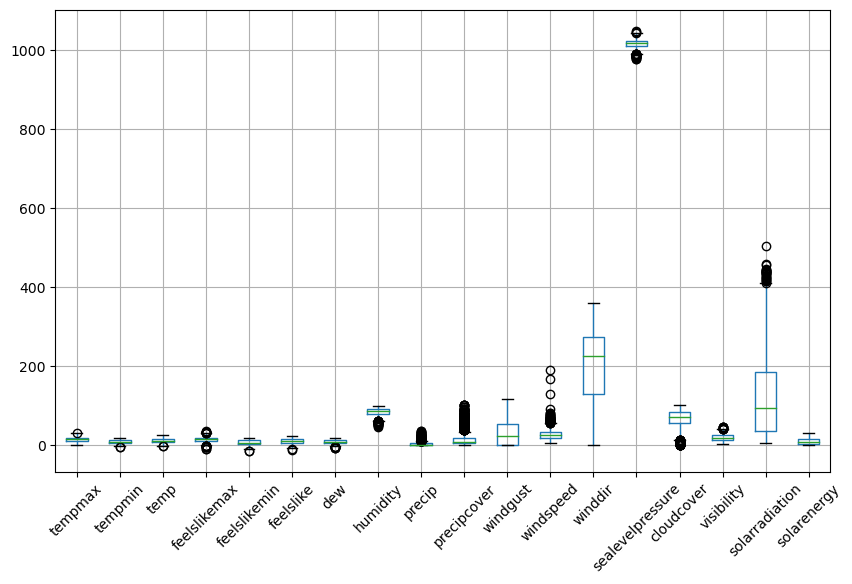

In [42]:
#analyze the outliers which dtypes are float
outlier_analysis_data_float = outlier_analysis_data.select_dtypes(include=['float64'])
outlier_analysis_data_float.boxplot(figsize=(10, 6))
plt.xticks(rotation=45)

Although there are some outliers in the data, but they are not extreme outliers, so we don't need to remove them

### Line diagrams demonstrating performance of each weather factors from 2017 to 2022:

<Figure size 1200x600 with 0 Axes>

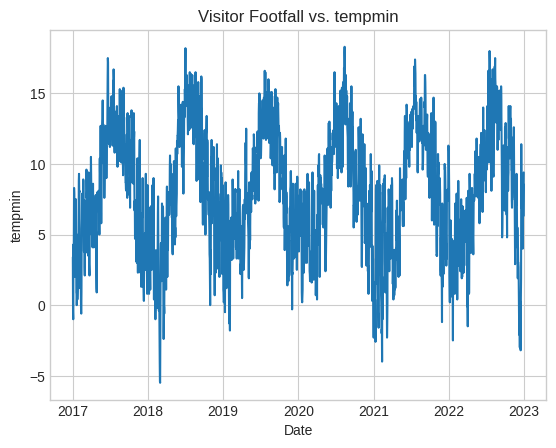

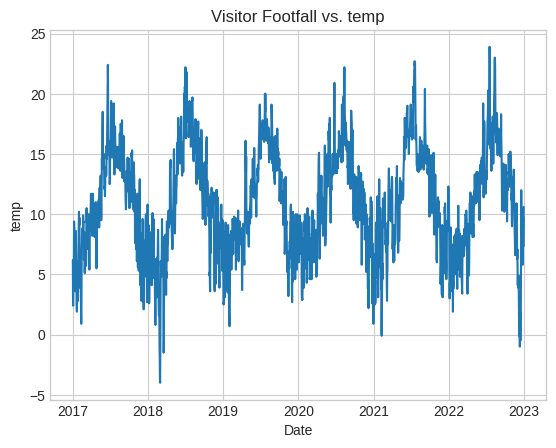

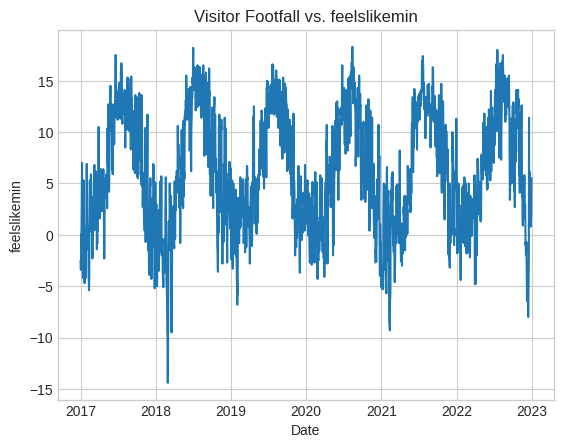

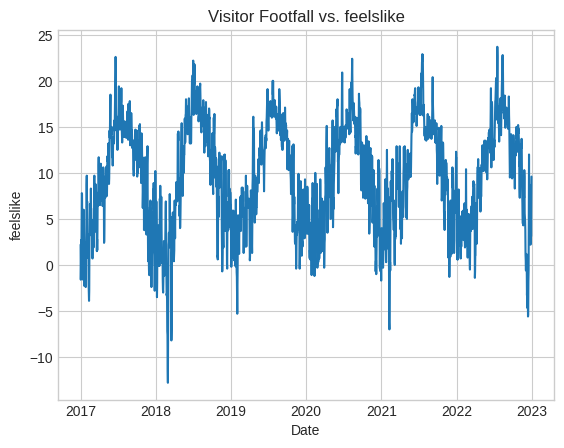

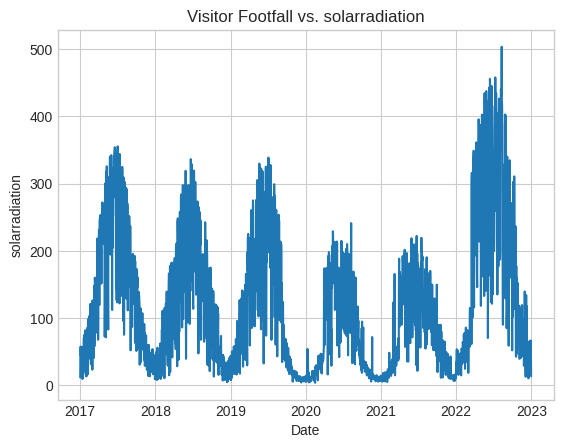

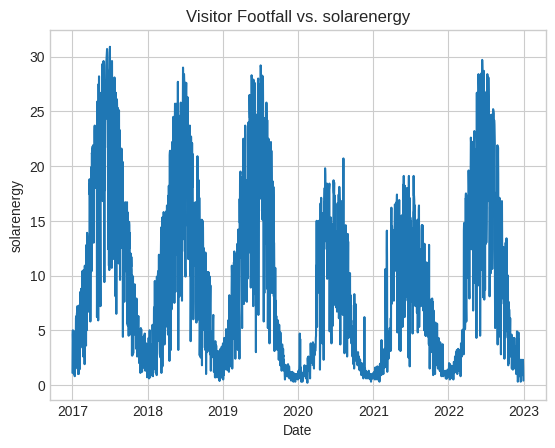

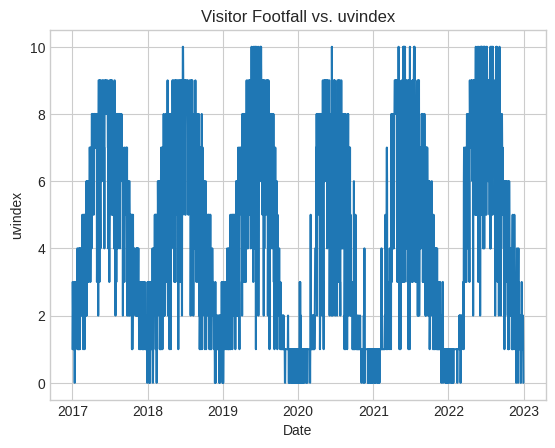

In [43]:
weather_columns = ['tempmin', 'temp', 'feelslikemin', 'feelslike', 'solarradiation', 'solarenergy', 'uvindex']


plt.figure(figsize=(12,6))
plt.style.use('seaborn-whitegrid')


for col in weather_columns:
    plt.figure()
    plt.plot(merged1['datetime'], merged1[col])
    plt.xlabel('Date')
    plt.ylabel(col)
    plt.title('Visitor Footfall vs. {}'.format(col))


plt.show()


Weather factors VS. Visitor Footfall (day total):

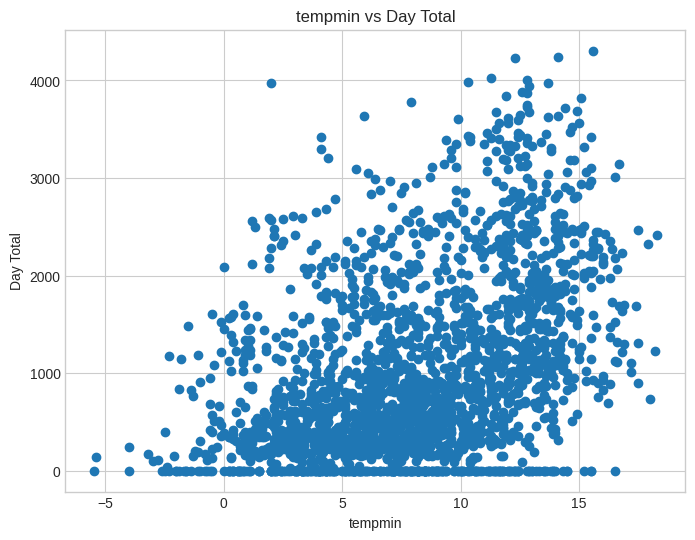

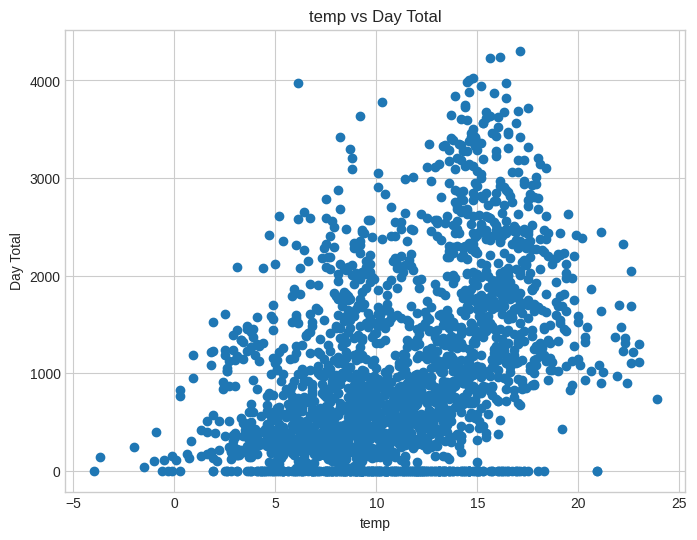

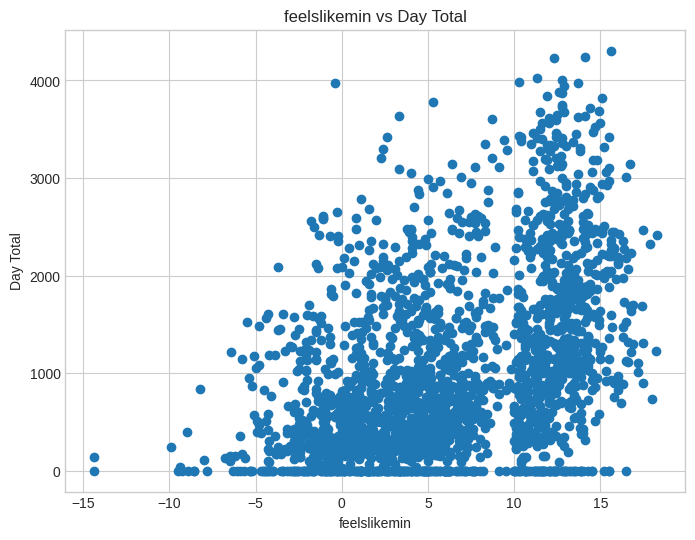

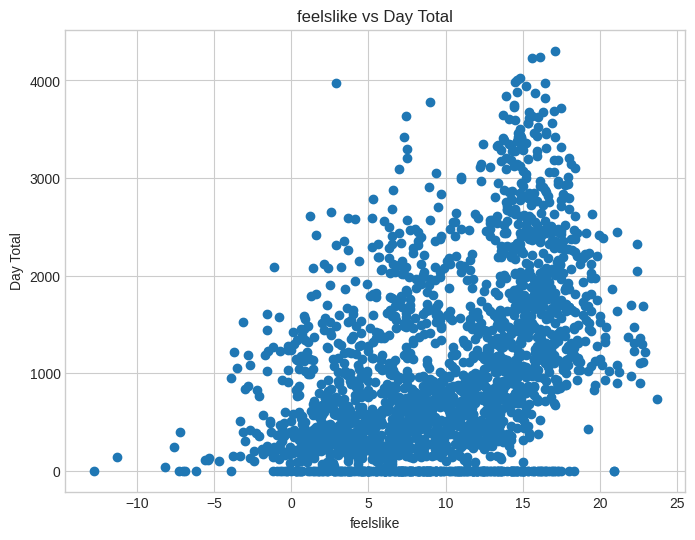

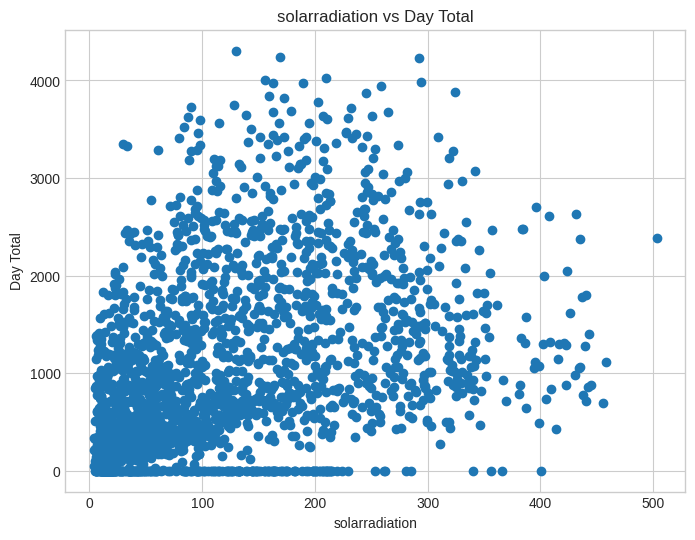

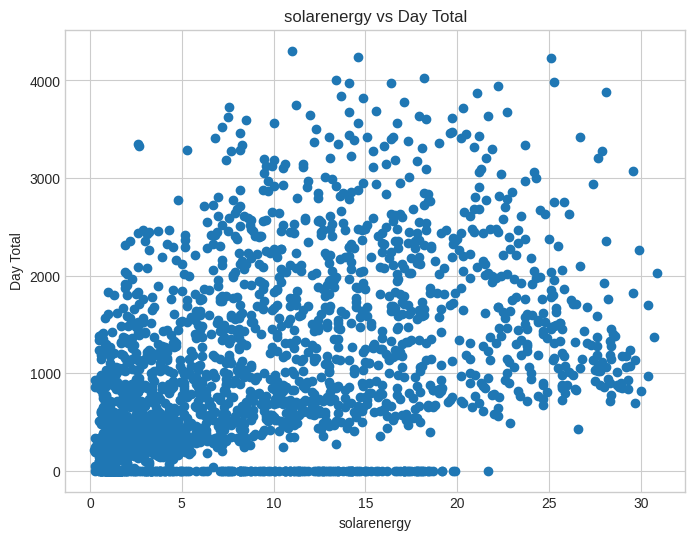

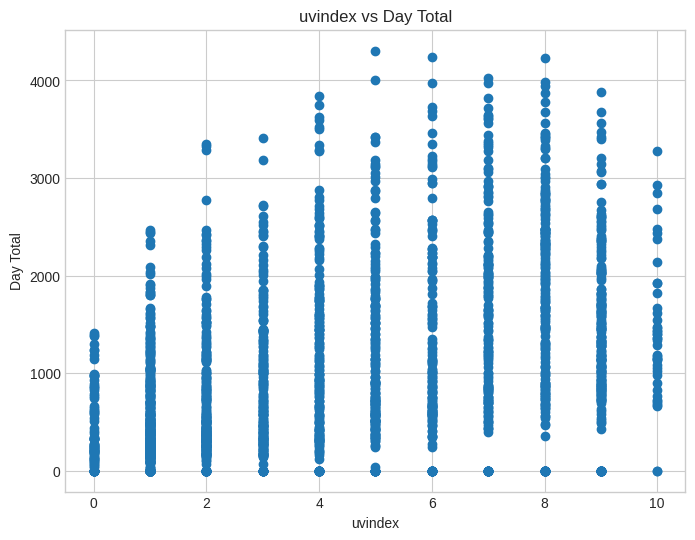

In [44]:
weather_factors = ['tempmin','temp', 'feelslikemin', 'feelslike', 'solarradiation', 'solarenergy', 'uvindex']
for factor in weather_factors:
    
    factor_data = merged1[merged1[factor].notnull()]

    # Plot the data for the current weather factor
    plt.figure(figsize=(8, 6))
    plt.scatter(factor_data[factor], factor_data['Day Total'])
    plt.title('{} vs Day Total'.format(factor))
    plt.xlabel(factor)
    plt.ylabel('Day Total')
    plt.show()


Same as previous step but separate the years due to COVID closure in a few periods:

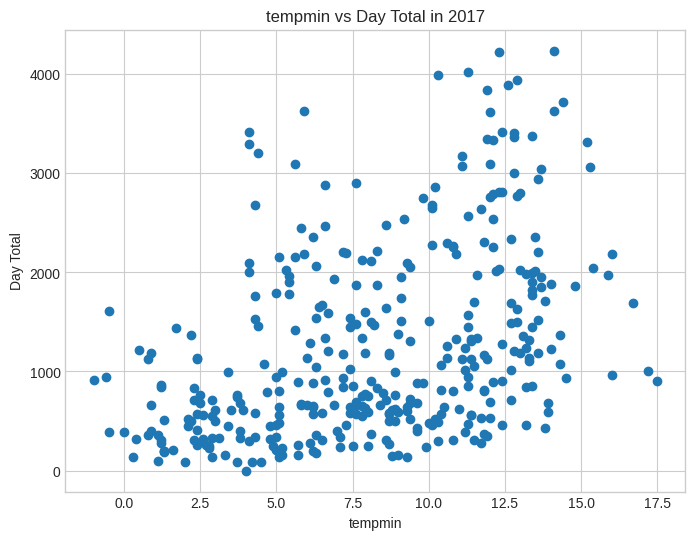

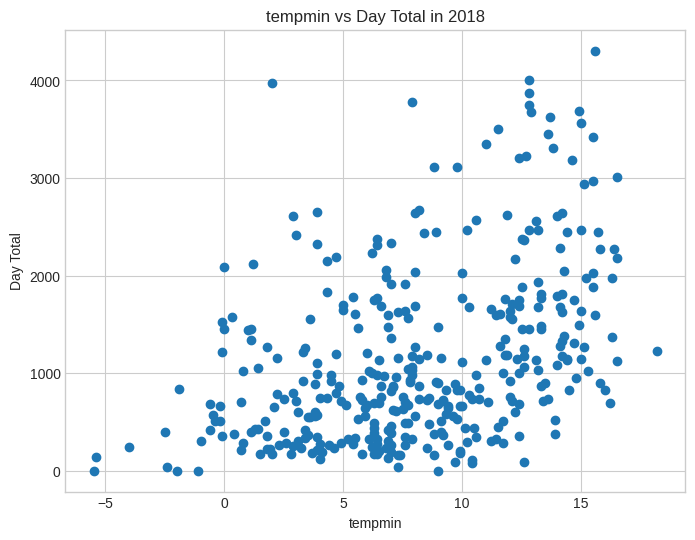

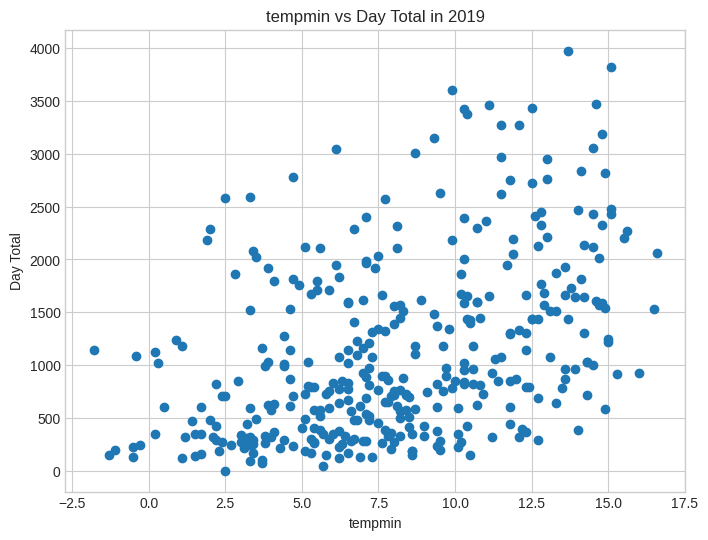

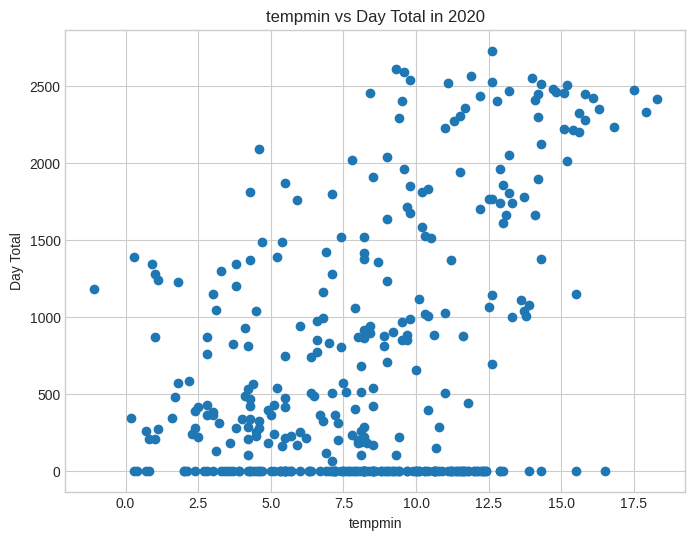

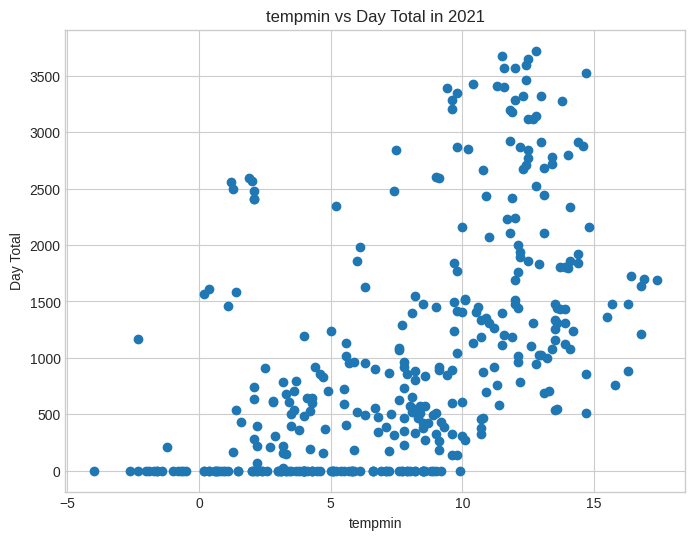

...

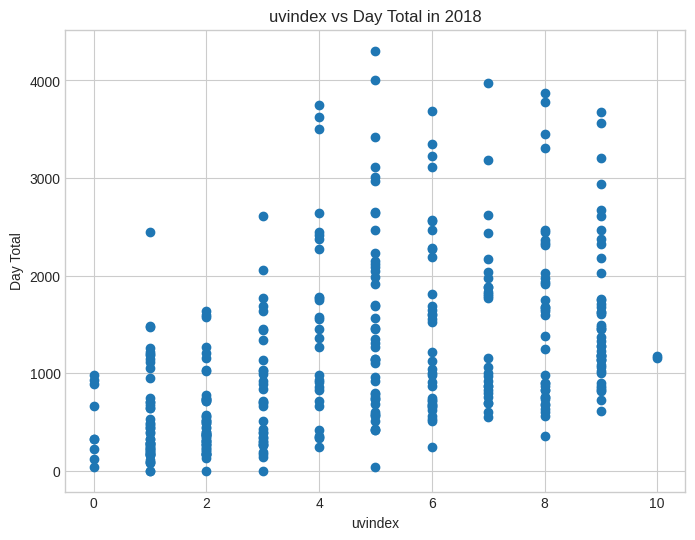

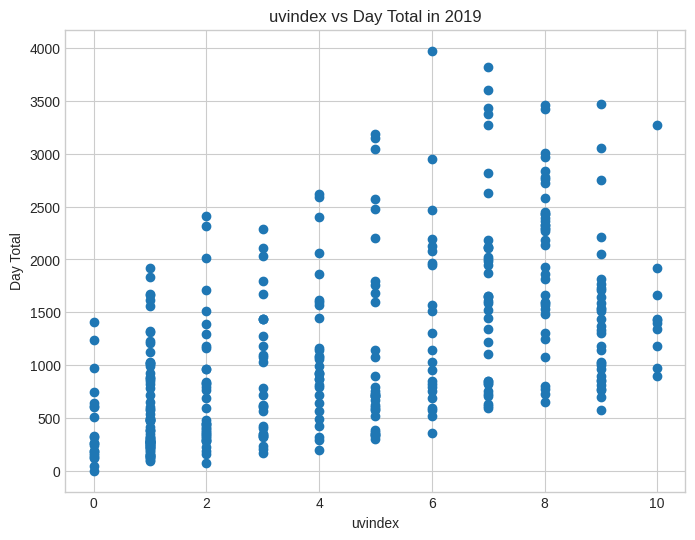

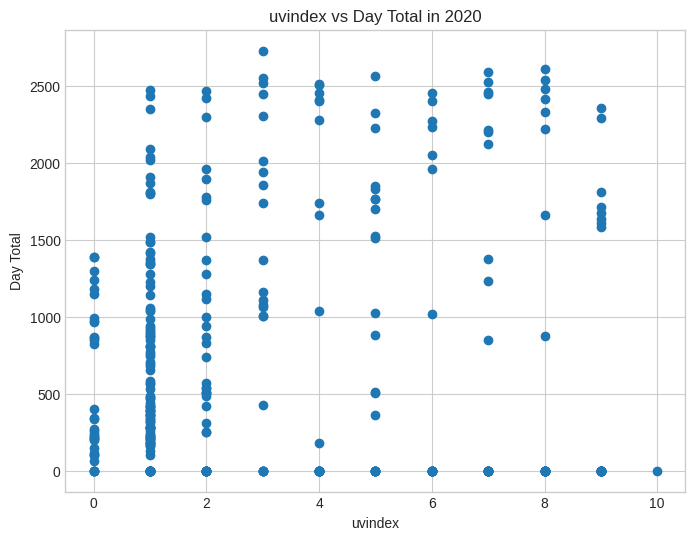

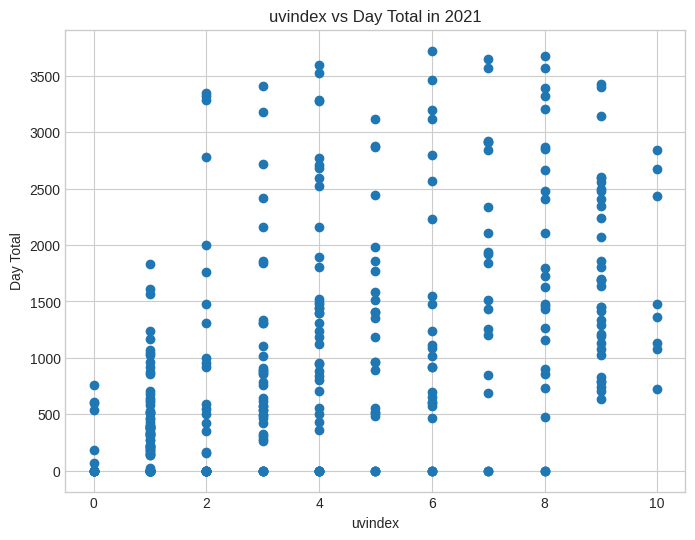

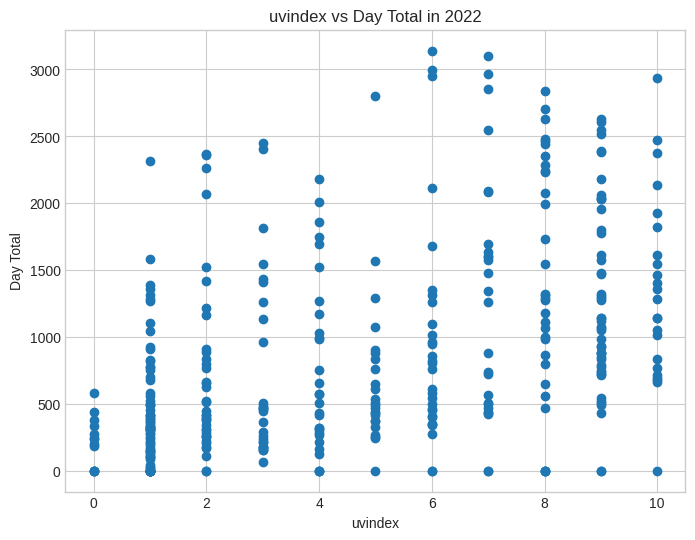

In [45]:
years = merged1['datetime'].dt.year.unique()
weather_factors = ['tempmin','temp', 'feelslikemin', 'feelslike', 'solarradiation', 'solarenergy', 'uvindex']
import matplotlib.pyplot as plt
for factor in weather_factors:
    for year in years:
        
        year_data = merged1[(merged1['datetime'].dt.year == year) & (merged1[factor].notnull())]

        plt.figure(figsize=(8, 6))
        plt.scatter(year_data[factor], year_data['Day Total'])
        plt.title('{} vs Day Total in {}'.format(factor, year))
        plt.xlabel(factor)
        plt.ylabel('Day Total')
        plt.show()

+heatmap?

In [46]:
merged1.head()

,Date,Day Total,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
0,2017-01-01,448.0,2017-01-01,8.4,3.4,6.2,5.1,-2.5,2.2,5.3,...,0,57.6,36.2,322.4,1018.3,84.8,17.5,11.6,1.1,1
1,2017-01-02,1610.0,2017-01-02,5.0,-0.5,2.5,1.1,-3.4,-1.6,0.0,...,0,NaN,28.6,35.5,1029.2,44.0,21.0,53.3,4.6,3
2,2017-01-03,910.0,2017-01-03,5.7,-1.0,2.4,3.3,-3.4,-0.2,0.2,...,0,NaN,19.3,299.6,1031.1,42.8,29.0,57.6,5.0,3
3,2017-01-04,336.0,2017-01-04,7.1,4.3,5.6,5.1,0.1,2.7,3.3,...,0,NaN,23.3,314.7,1028.6,92.6,31.3,44.5,3.8,2
4,2017-01-05,497.0,2017-01-05,5.9,2.2,3.8,3.1,-1.1,0.9,0.3,...,0,NaN,14.3,100.8,1033.8,79.8,24.6,48.2,4.1,2


/tmp/ipykernel_131358/1527910306.py:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(year_data.corr())


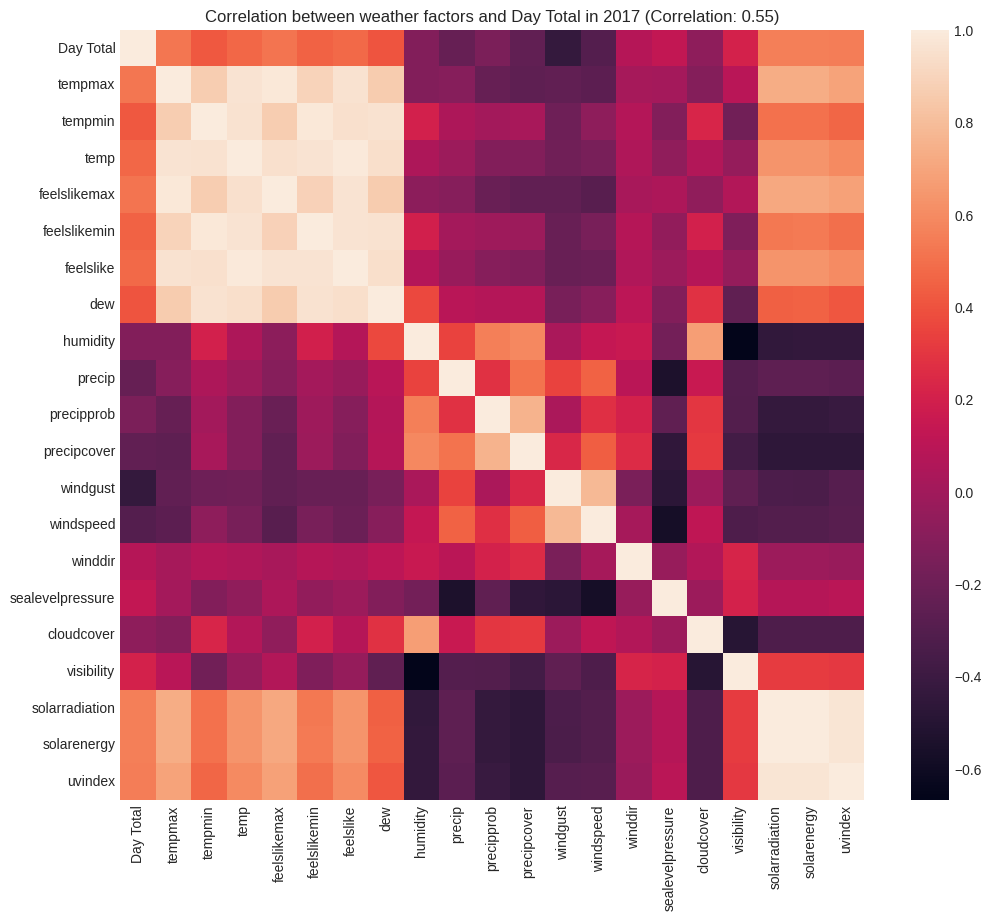

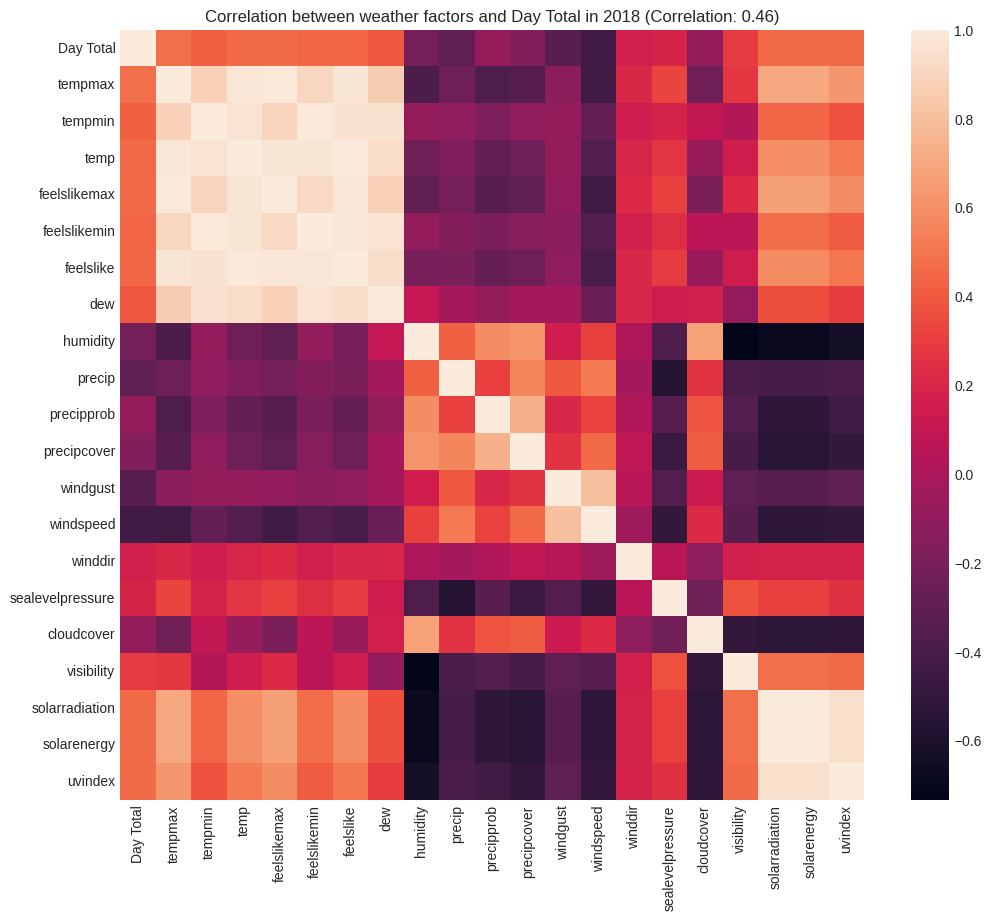

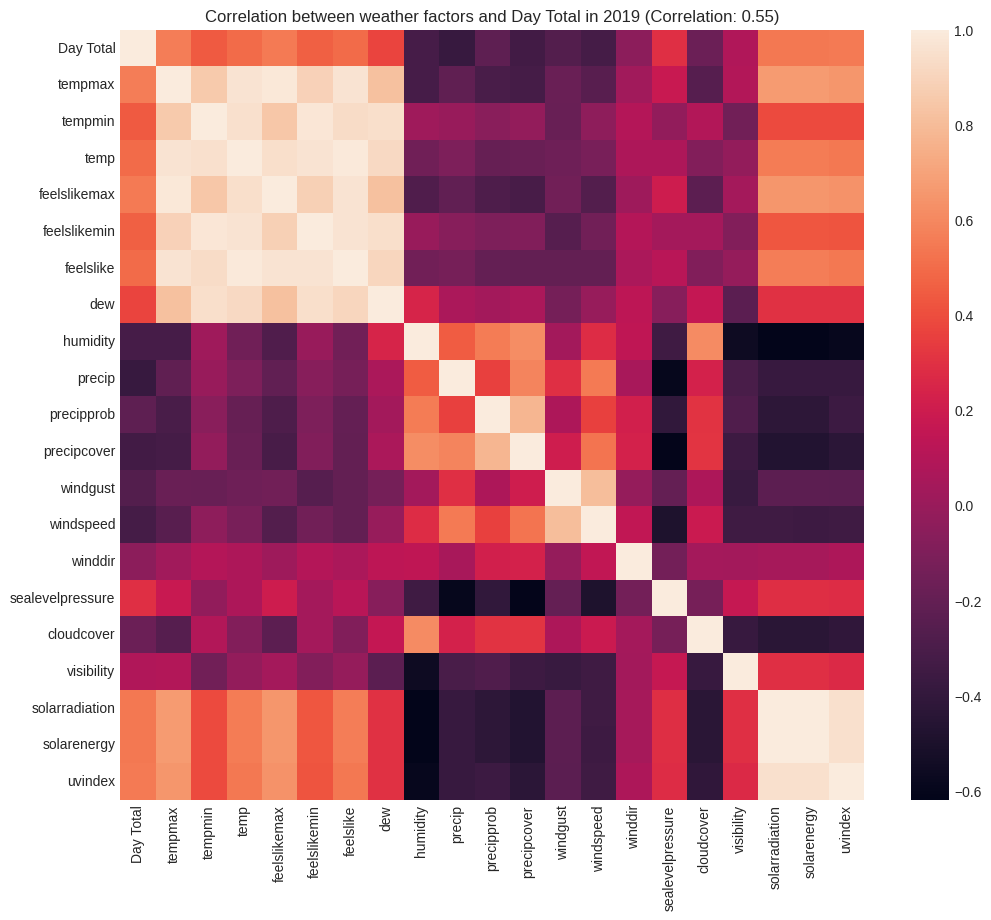

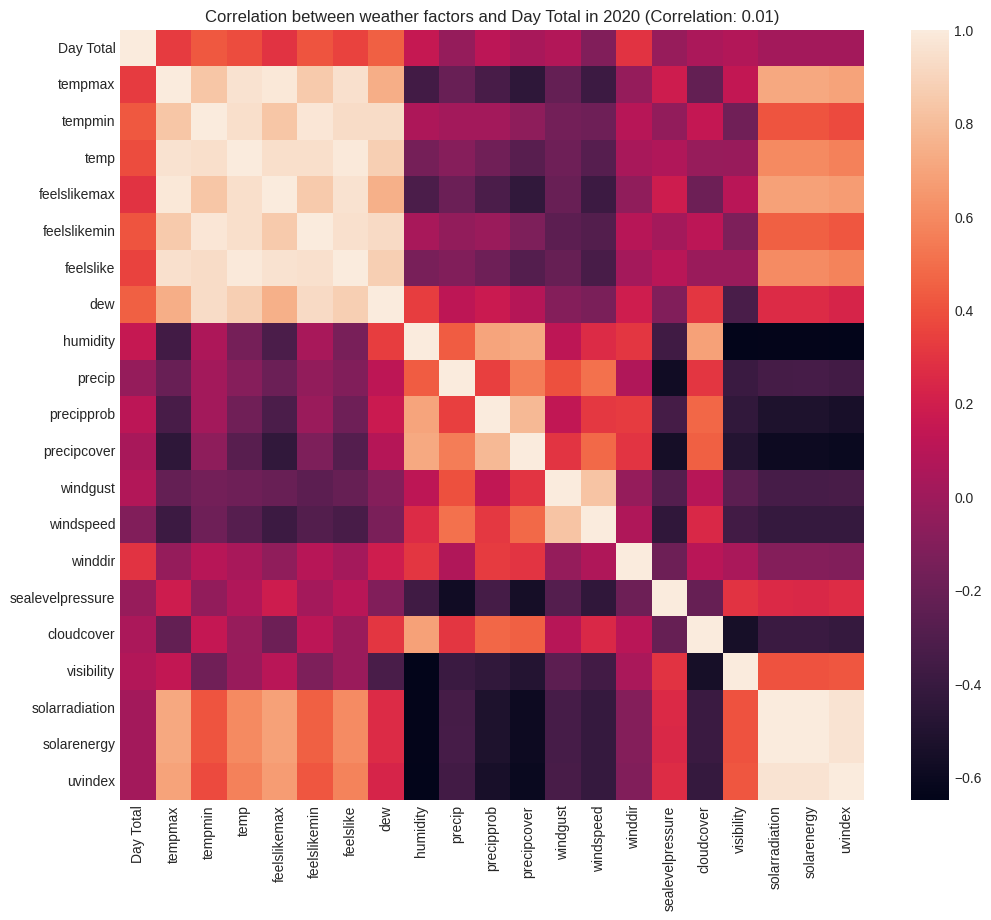

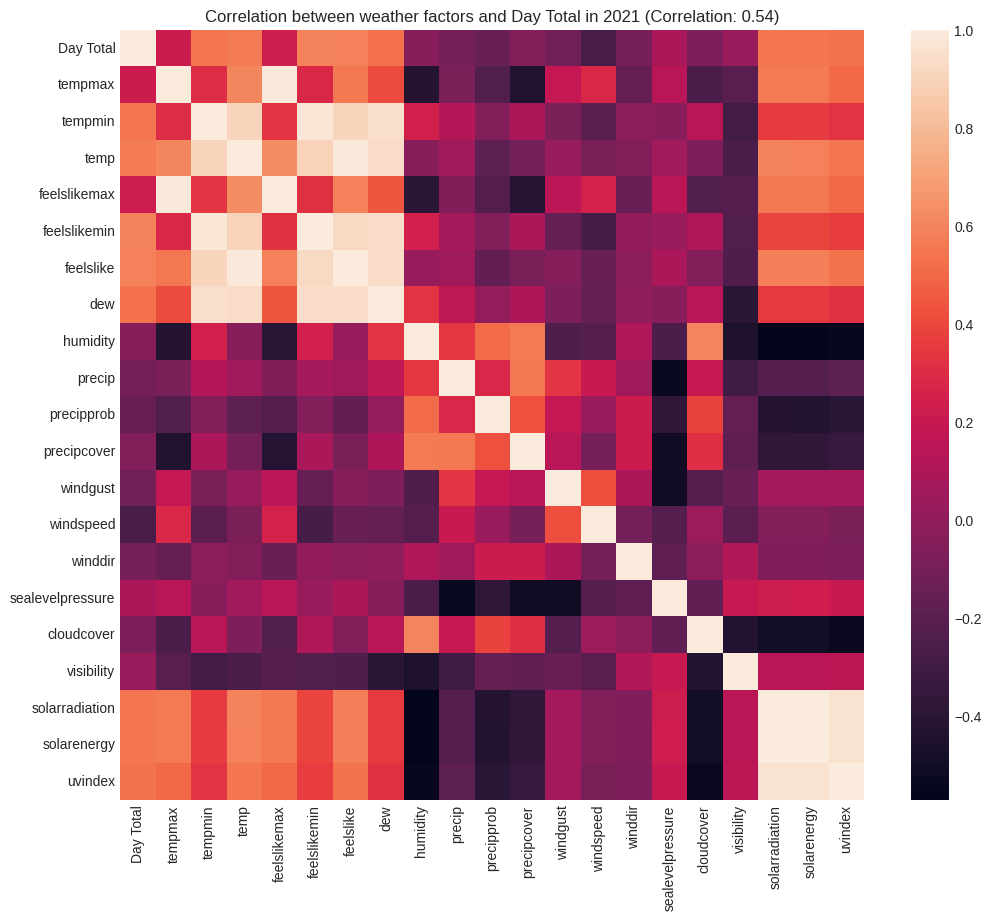

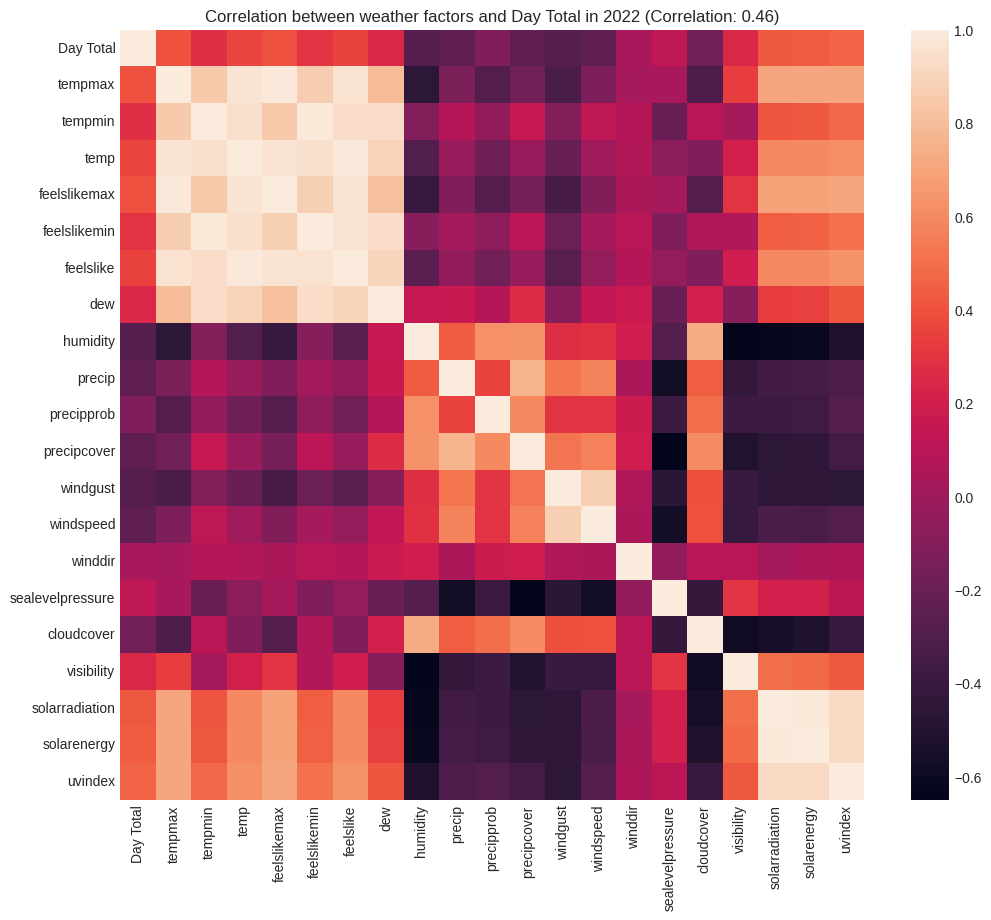

In [47]:
#plot the correlation between weather factors and footfall['Day Total'] with heatmap
years = merged1['datetime'].dt.year.unique()
merged1 = merged1.drop(['snow','snowdepth'], axis=1)

for year in years:
    year_data = merged1[(merged1['datetime'].dt.year == year) & (merged1[factor].notnull())]
    correlation = year_data['Day Total'].corr(year_data[factor])
    plt.figure(figsize=(12, 10))
    sns.heatmap(year_data.corr())
    plt.title('Correlation between weather factors and Day Total in {} (Correlation: {:.2f})'.format(year, correlation))
    plt.show()

/tmp/ipykernel_131358/651860765.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = merged1.corr()


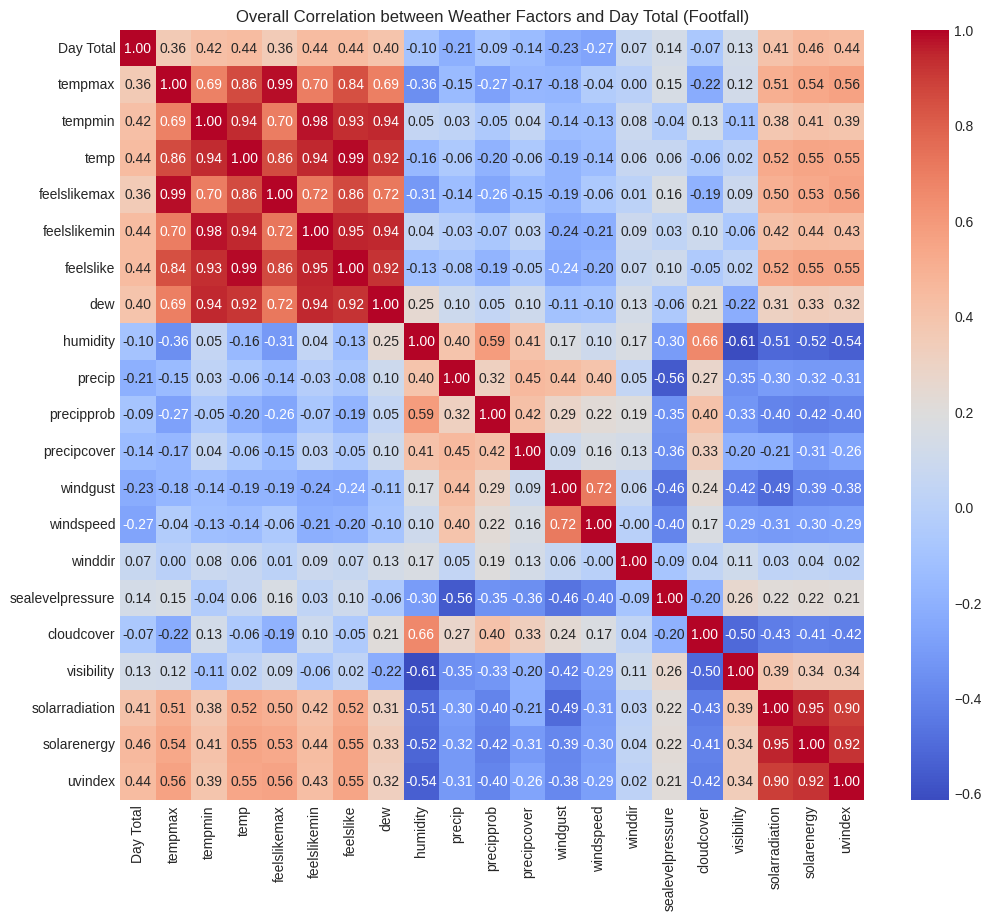

In [48]:
correlation_matrix = merged1.corr()

# Plot the overall correlation matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Overall Correlation between Weather Factors and Day Total (Footfall)')
plt.show()


## 2.1. Footfall - Visitor segmentation 

In [49]:
segment = pd.read_csv('Footfall_visitor_seg.csv')

segment.head()

,Date,AdmissionsAD,AdmissionsCH,EducationAD,EducationCH,FamilyAD,FamilyCH,TicketFOCAD,TicketFOCCH,DayvisitorTotal,MembersAD,MembersCH,MemberTotal,Day Total,Cumulative0,Last Year,Under 3's,Difference
0,2017/1/1,130,22,0,0,20,20,6,4,202,172,74,246,448,31703,"22,520",NaN,"9,183"
1,2017/1/2,334,90,3,8,84,84,37,2,642,630,338,968,1610,33313,"23,356",NaN,"9,957"
2,2017/1/3,162,46,23,72,30,30,17,7,387,320,203,523,910,34223,"23,847",NaN,"10,376"
3,2017/1/4,100,18,12,26,4,4,7,2,173,124,39,163,336,34559,"24,368",NaN,"10,191"
4,2017/1/5,97,6,19,107,6,6,9,0,250,210,37,247,497,35056,"24,630",NaN,"10,426"


In [50]:
segment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2191 entries, 0 to 2190
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Date             2191 non-null   object 
 1   AdmissionsAD     2191 non-null   object 
 2   AdmissionsCH     2191 non-null   int64  
 3   EducationAD      2191 non-null   int64  
 4   EducationCH      2191 non-null   int64  
 5   FamilyAD         2191 non-null   int64  
 6   FamilyCH         2191 non-null   int64  
 7   TicketFOCAD      2191 non-null   int64  
 8   TicketFOCCH      2191 non-null   int64  
 9   DayvisitorTotal  2191 non-null   object 
 10  MembersAD        2191 non-null   int64  
 11  MembersCH        2191 non-null   int64  
 12  MemberTotal      2191 non-null   object 
 13  Day Total        2191 non-null   object 
 14  Cumulative0      2191 non-null   object 
 15  Last Year        2191 non-null   object 
 16  Under 3's        4 non-null      float64
 17  Difference    

In [51]:
segment = segment[["Date", "DayvisitorTotal", "MemberTotal", "Day Total"]]  # Keep only the selected columns
segment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2191 entries, 0 to 2190
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Date             2191 non-null   object
 1   DayvisitorTotal  2191 non-null   object
 2   MemberTotal      2191 non-null   object
 3   Day Total        2191 non-null   object
dtypes: object(4)
memory usage: 68.6+ KB


In [52]:
segment["DayvisitorTotal"] = pd.to_numeric(segment["DayvisitorTotal"], errors="coerce")
segment["MemberTotal"] = pd.to_numeric(segment["MemberTotal"], errors="coerce")
segment["Day Total"] = pd.to_numeric(segment["Day Total"], errors="coerce")

segment['Date'] = pd.to_datetime(segment['Date'], errors='coerce')

segment["DayvisitorTotal"].fillna(0, inplace=True)
segment["MemberTotal"].fillna(0, inplace=True)
segment["Day Total"].fillna(0, inplace=True)


In [53]:
segment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2191 entries, 0 to 2190
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Date             2191 non-null   datetime64[ns]
 1   DayvisitorTotal  2191 non-null   float64       
 2   MemberTotal      2191 non-null   float64       
 3   Day Total        2191 non-null   float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 68.6 KB


## 2.2. Relations between weather & footfall (member vs. day visitor) 

In [54]:
# Merge weather data with visitor data
merged2 = pd.merge(segment, weather, left_on='Date', right_on='datetime')

# Calculate the correlation between weather factors and DayvisitorTotal
correlation_dayvisitor = merged2.corr()['DayvisitorTotal'].sort_values(ascending=False)

# Calculate the correlation between weather factors and MemberTotal
correlation_member = merged2.corr()['MemberTotal'].sort_values(ascending=False)


print("Correlation between weather factors and DayvisitorTotal:")
print(correlation_dayvisitor)

print("\nCorrelation between weather factors and MemberTotal:")
print(correlation_member)




Correlation between weather factors and DayvisitorTotal:
DayvisitorTotal     1.000000
MemberTotal         0.073724
solarradiation      0.056097
precipprob          0.044865
solarenergy         0.043180
winddir             0.033977
humidity            0.033295
precipcover         0.022979
uvindex             0.014428
precip              0.013107
sealevelpressure    0.003825
visibility          0.001804
feelslikemin       -0.005527
tempmin            -0.013562
dew                -0.018735
feelslike          -0.019405
cloudcover         -0.025680
temp               -0.031921
windspeed          -0.036523
windgust           -0.044984
Day Total          -0.055700
feelslikemax       -0.068939
tempmax            -0.078436
snow                     NaN
snowdepth                NaN
Name: DayvisitorTotal, dtype: float64

Correlation between weather factors and MemberTotal:
MemberTotal         1.000000
Day Total           0.578019
solarenergy         0.226063
uvindex             0.201825
solarradia

/tmp/ipykernel_131358/3386688330.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_dayvisitor = merged2.corr()['DayvisitorTotal'].sort_values(ascending=False)
/tmp/ipykernel_131358/3386688330.py:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_member = merged2.corr()['MemberTotal'].sort_values(ascending=False)


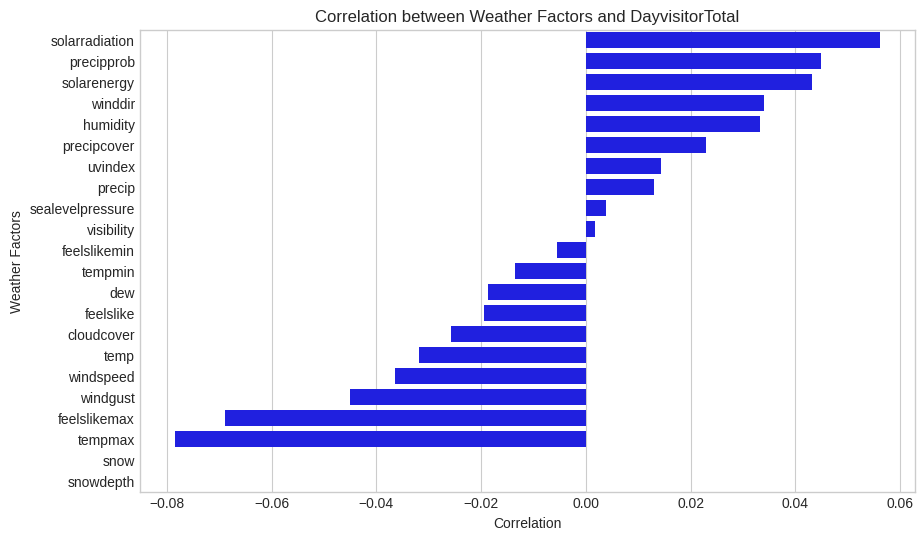

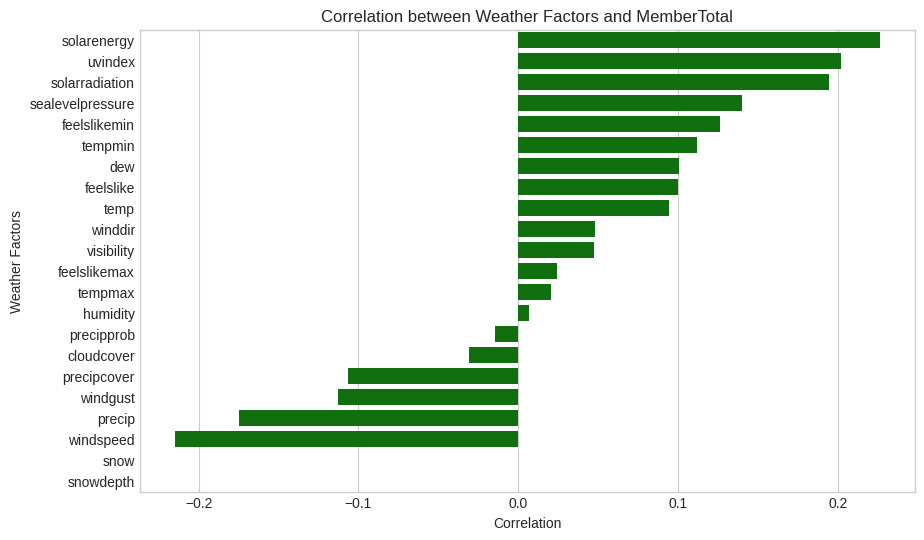

In [55]:
exclude_columns = ['DayvisitorTotal', 'MemberTotal', 'Day Total']

#dayvisitor
correlation_dayvisitor_factors = correlation_dayvisitor.drop(exclude_columns)
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_dayvisitor_factors.values, y=correlation_dayvisitor_factors.index, color='blue')

plt.xlabel("Correlation")
plt.ylabel("Weather Factors")
plt.title("Correlation between Weather Factors and DayvisitorTotal")

plt.show()


#member
correlation_member_factors = correlation_member.drop(exclude_columns)
plt.figure(figsize=(10, 6))
sns.barplot(x=correlation_member_factors.values, y=correlation_member_factors.index, color='green')

plt.xlabel("Correlation")
plt.ylabel("Weather Factors")
plt.title("Correlation between Weather Factors and MemberTotal")


plt.show()


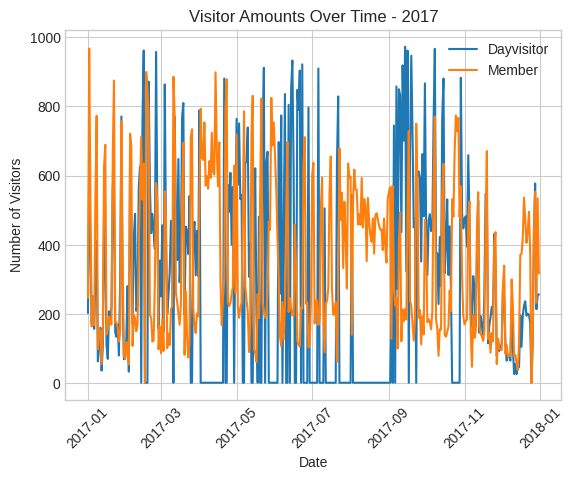

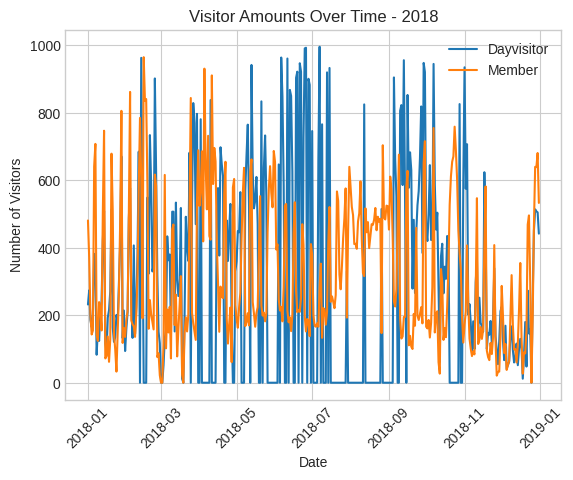

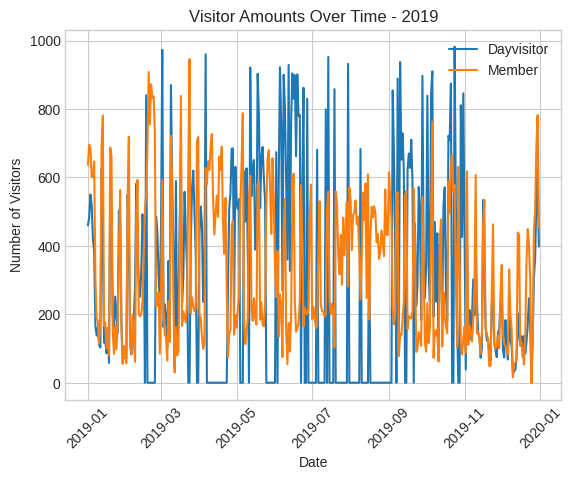

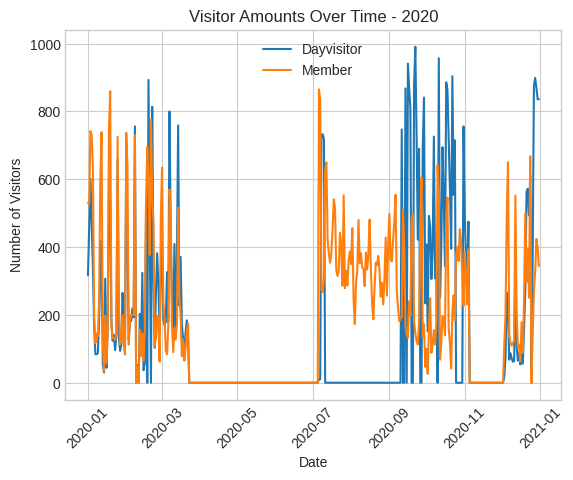

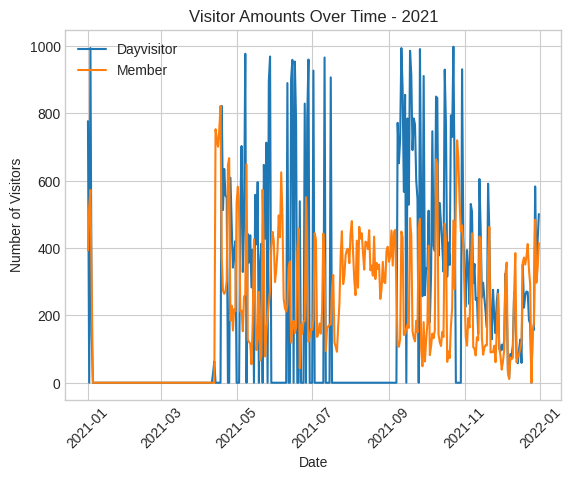

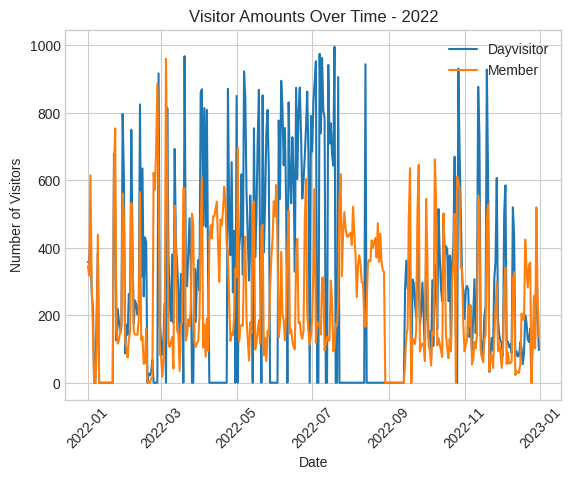

In [56]:
segment['Year'] = segment['Date'].dt.year

years = segment['Year'].unique()

for year in years:
    year_data = segment[segment['Year'] == year]
    
    plt.figure() 
    plt.plot(year_data['Date'], year_data['DayvisitorTotal'], label='Dayvisitor')
    plt.plot(year_data['Date'], year_data['MemberTotal'], label='Member')

    plt.xlabel('Date')
    plt.ylabel('Number of Visitors')
    plt.title(f'Visitor Amounts Over Time - {year}')
    plt.legend()
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()


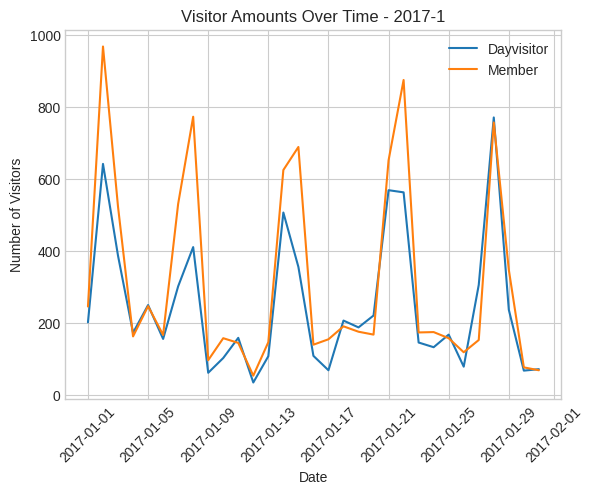

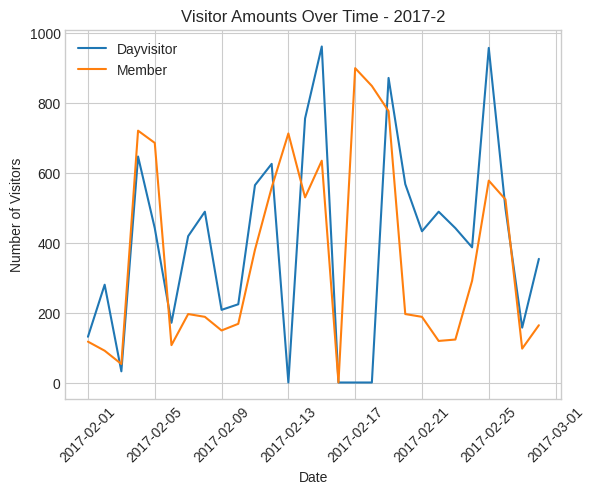

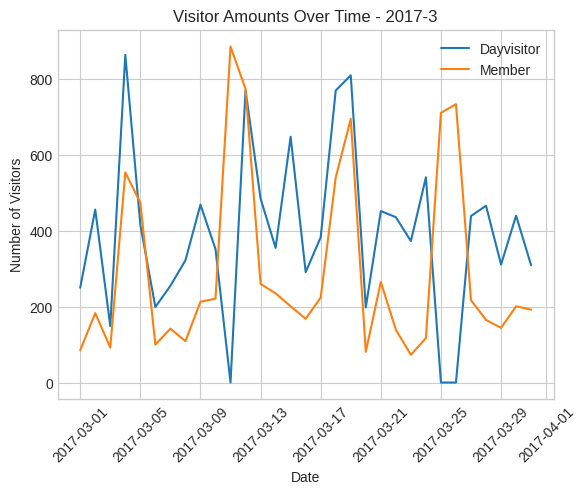

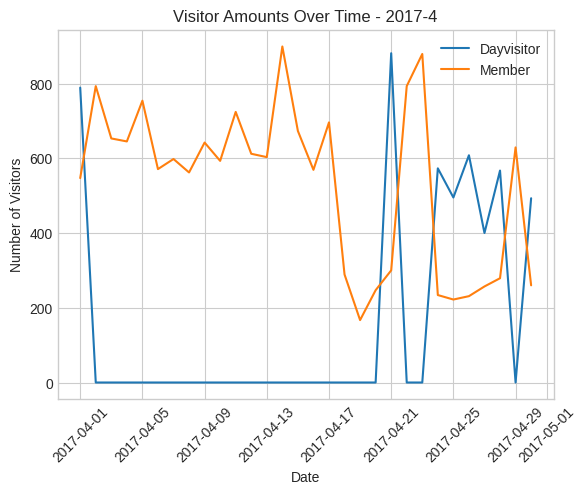

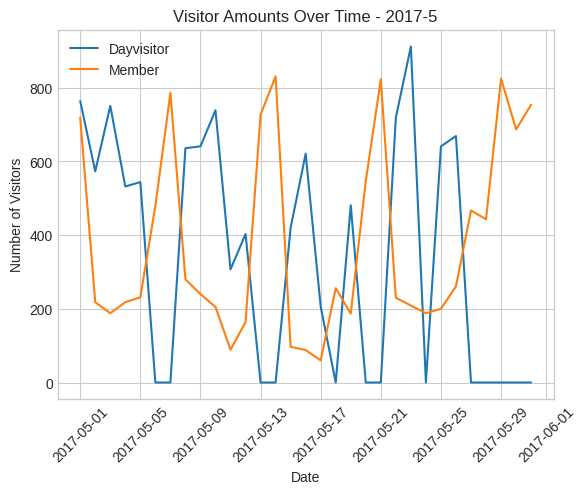

...

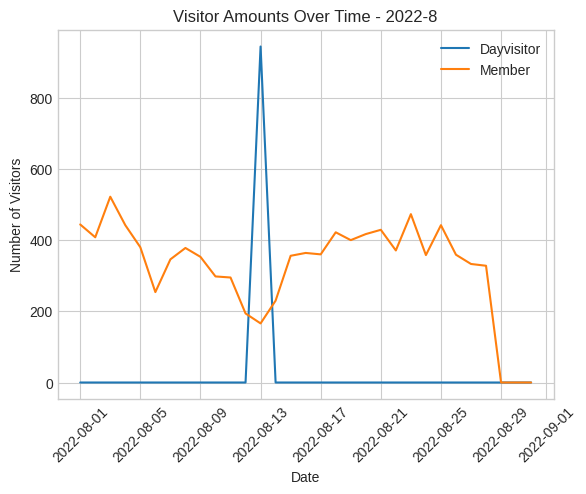

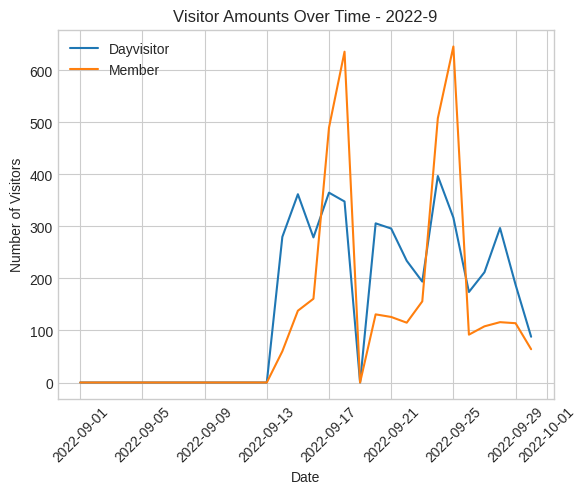

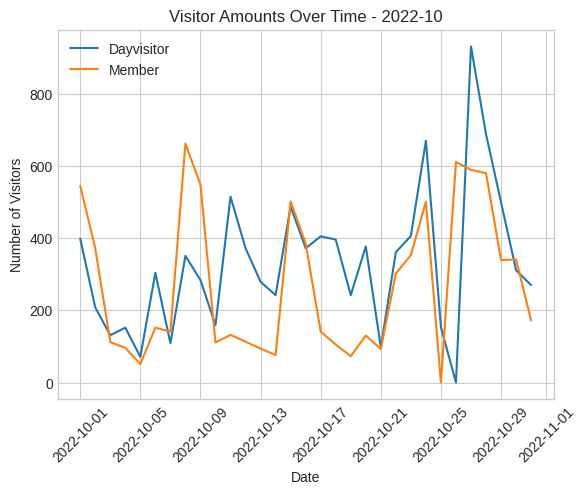

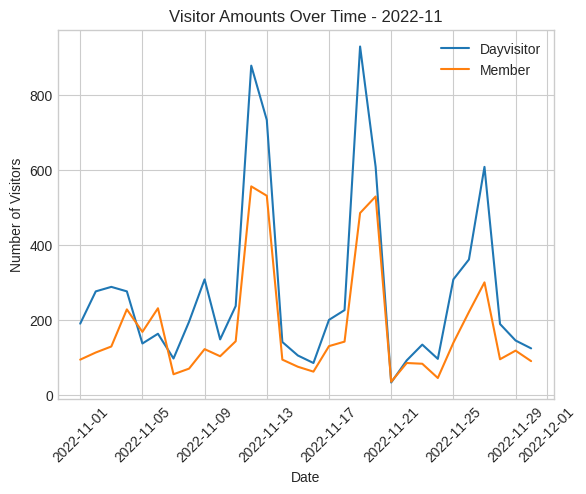

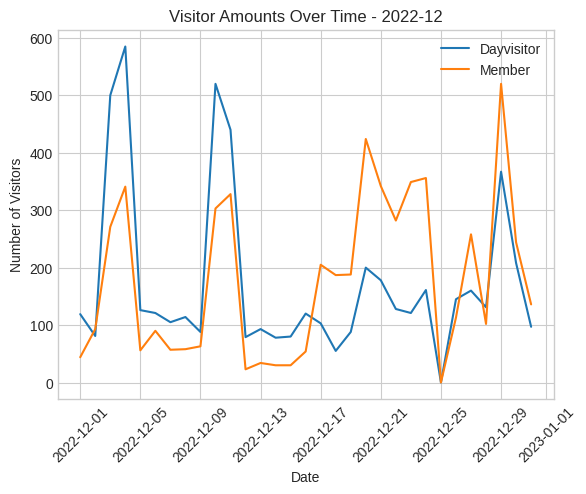

In [57]:
years = segment['Year'].unique()

for year in years:
    year_data = segment[segment['Year'] == year]
    months = year_data['Date'].dt.month.unique()

    for month in months:
        month_data = year_data[year_data['Date'].dt.month == month]

        plt.figure()  
        plt.plot(month_data['Date'], month_data['DayvisitorTotal'], label='Dayvisitor')
        plt.plot(month_data['Date'], month_data['MemberTotal'], label='Member')

        plt.xlabel('Date')
        plt.ylabel('Number of Visitors')
        plt.title(f'Visitor Amounts Over Time - {year}-{month}')
        plt.legend()
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.show()

## 2.3 Weekdays Analysis

In [58]:
# Convert the 'Date' column to datetime type
merged['Date'] = pd.to_datetime(merged['Date'])

# Add a new column for the day of the week
merged['Weekday'] = merged['Date'].dt.day_name()



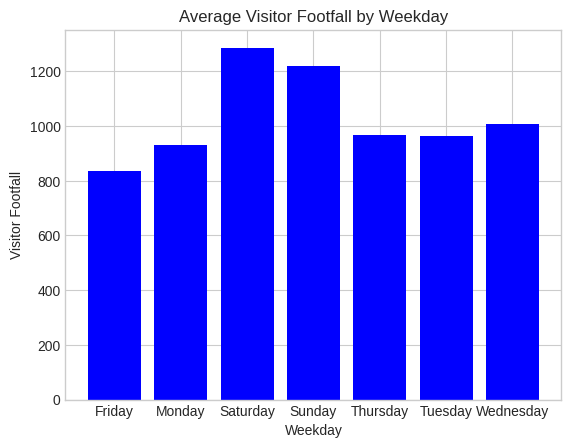

In [59]:
weekday_footfall = merged.groupby('Weekday')['Day Total'].mean()

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

plt.bar(weekday_footfall.index, weekday_footfall, color='blue')
plt.xlabel('Weekday')
plt.ylabel('Visitor Footfall')
plt.title('Average Visitor Footfall by Weekday')
plt.xticks(weekday_order)
plt.show()

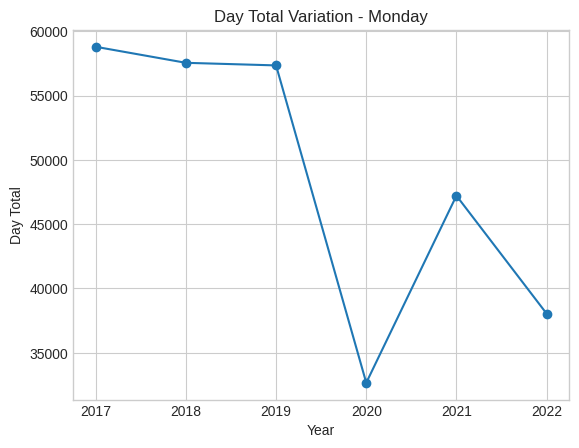

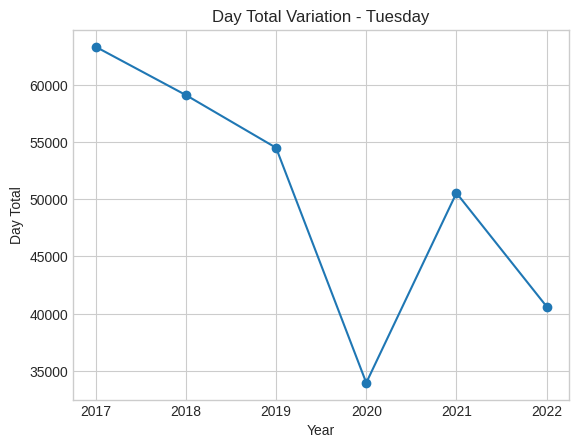

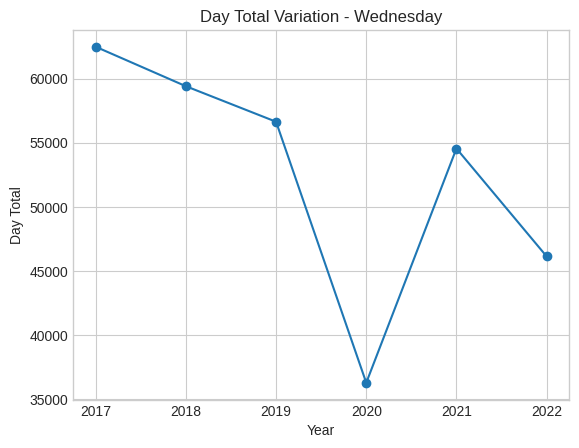

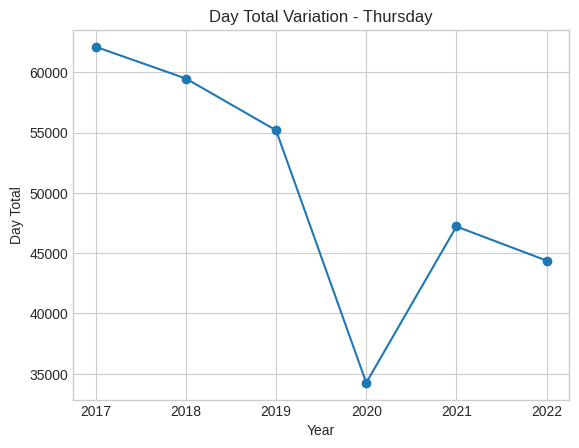

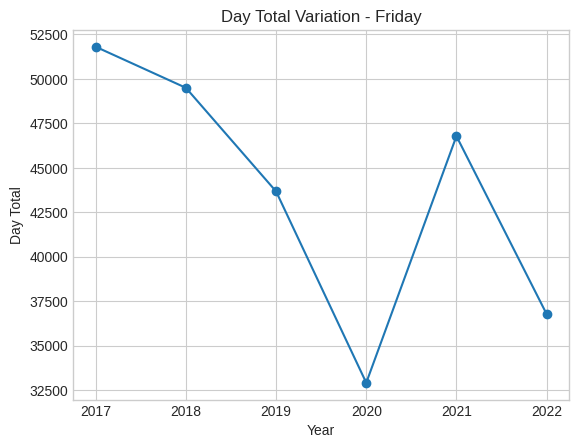

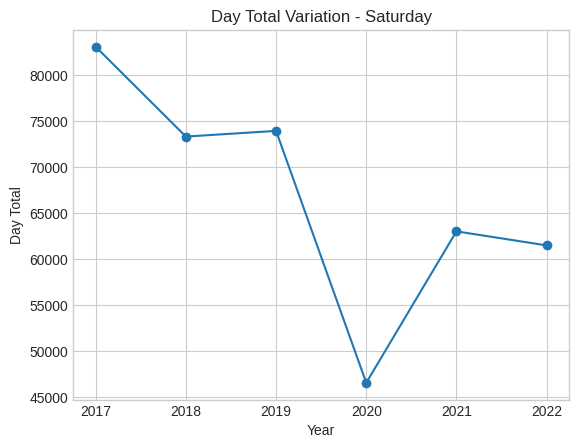

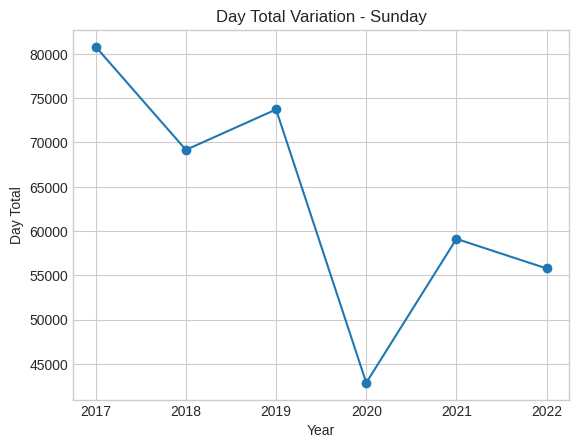

In [60]:
weekday_footfall = merged.groupby('Weekday')['Day Total'].sum()

weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for weekday in weekday_order:

    weekday_data = merged[merged['Weekday'] == weekday]
    
    yearly_footfall = weekday_data.groupby(weekday_data['Date'].dt.year)['Day Total'].sum()
    
    plt.plot(yearly_footfall.index, yearly_footfall, marker='o')
    plt.xlabel('Year')
    plt.ylabel('Day Total')
    plt.title(f'Day Total Variation - {weekday}')
    plt.grid(True)
    plt.show()


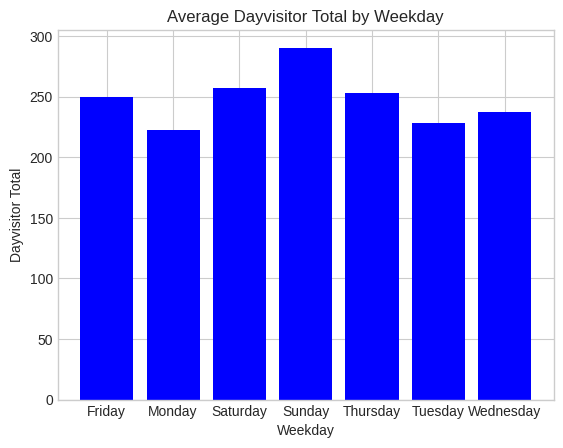

In [61]:
segment['Date'] = pd.to_datetime(segment['Date'])

segment['Weekday'] = segment['Date'].dt.day_name()

weekday_dayvisitor = segment.groupby('Weekday')['DayvisitorTotal'].mean()


plt.bar(weekday_dayvisitor.index, weekday_dayvisitor, color='blue')
plt.xlabel('Weekday')
plt.ylabel('Dayvisitor Total')
plt.title('Average Dayvisitor Total by Weekday')
plt.xticks(weekday_order) 
plt.show()

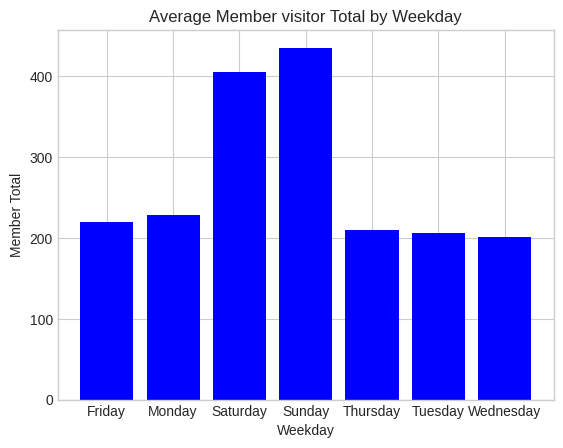

In [62]:
segment['Date'] = pd.to_datetime(segment['Date'])

segment['Weekday'] = segment['Date'].dt.day_name()

weekday_dayvisitor = segment.groupby('Weekday')['MemberTotal'].mean()

plt.bar(weekday_dayvisitor.index, weekday_dayvisitor, color='blue')
plt.xlabel('Weekday')
plt.ylabel('Member Total')
plt.title('Average Member visitor Total by Weekday')
plt.xticks(weekday_order) 
plt.show()

## 2.4
Randomly select specific days with different weather factors (e.g. sunny day in summer/winter VS. rainy day in summer/winter) to see the behavioural differences between day visitors and members.



In [63]:
merged2['preciptype'] = merged2['preciptype'].replace(np.nan, 0)
merged2['preciptype'] = merged2['preciptype'].replace('rain',1)
merged2['preciptype'] = merged2['preciptype'].replace('snow',2)
merged2['preciptype'] = merged2['preciptype'].replace('rain,snow',3)
merged2['preciptype'] = merged2['preciptype'].astype(int)
merged2.head()

,Date,DayvisitorTotal,MemberTotal,Day Total,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
0,2017-01-01,202.0,246.0,448.0,2017-01-01,8.4,3.4,6.2,5.1,-2.5,...,0,57.6,36.2,322.4,1018.3,84.8,17.5,11.6,1.1,1
1,2017-01-02,642.0,968.0,1610.0,2017-01-02,5.0,-0.5,2.5,1.1,-3.4,...,0,NaN,28.6,35.5,1029.2,44.0,21.0,53.3,4.6,3
2,2017-01-03,387.0,523.0,910.0,2017-01-03,5.7,-1.0,2.4,3.3,-3.4,...,0,NaN,19.3,299.6,1031.1,42.8,29.0,57.6,5.0,3
3,2017-01-04,173.0,163.0,336.0,2017-01-04,7.1,4.3,5.6,5.1,0.1,...,0,NaN,23.3,314.7,1028.6,92.6,31.3,44.5,3.8,2
4,2017-01-05,250.0,247.0,497.0,2017-01-05,5.9,2.2,3.8,3.1,-1.1,...,0,NaN,14.3,100.8,1033.8,79.8,24.6,48.2,4.1,2


In [64]:
merged2.groupby('preciptype').count()

,Date,DayvisitorTotal,MemberTotal,Day Total,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
preciptype,,,,,,,,,,,,,,,,,,,,,
0,464,464,464,464,464,464,464,464,464,464,...,464,156,464,464,464,464,464,464,464,464
1,1671,1671,1671,1671,1671,1671,1671,1671,1671,1671,...,1671,970,1671,1671,1671,1671,1671,1671,1671,1671
2,3,3,3,3,3,3,3,3,3,3,...,3,3,3,3,3,3,3,3,3,3
3,53,53,53,53,53,53,53,53,53,53,...,53,25,53,53,53,53,53,53,53,53


In [65]:
weather_factors_analysis_data = merged2.copy()
weather_factors_analysis_data = weather_factors_analysis_data.drop([ 'datetime'], axis=1)
weather_factors_analysis_data.head()

,Date,DayvisitorTotal,MemberTotal,Day Total,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,...,snowdepth,windgust,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex
0,2017-01-01,202.0,246.0,448.0,8.4,3.4,6.2,5.1,-2.5,2.2,...,0,57.6,36.2,322.4,1018.3,84.8,17.5,11.6,1.1,1
1,2017-01-02,642.0,968.0,1610.0,5.0,-0.5,2.5,1.1,-3.4,-1.6,...,0,NaN,28.6,35.5,1029.2,44.0,21.0,53.3,4.6,3
2,2017-01-03,387.0,523.0,910.0,5.7,-1.0,2.4,3.3,-3.4,-0.2,...,0,NaN,19.3,299.6,1031.1,42.8,29.0,57.6,5.0,3
3,2017-01-04,173.0,163.0,336.0,7.1,4.3,5.6,5.1,0.1,2.7,...,0,NaN,23.3,314.7,1028.6,92.6,31.3,44.5,3.8,2
4,2017-01-05,250.0,247.0,497.0,5.9,2.2,3.8,3.1,-1.1,0.9,...,0,NaN,14.3,100.8,1033.8,79.8,24.6,48.2,4.1,2


In [66]:
segment['Season'] = segment['Date'].dt.month.apply(lambda x: 'Spring' if x in [3, 4, 5] else ('Summer' if x in [6, 7, 8] else ('Autumn' if x in [9, 10, 11] else 'Winter')))
segment['preciptype'] = weather_factors_analysis_data['preciptype']
segment.head()

,Date,DayvisitorTotal,MemberTotal,Day Total,Year,Weekday,Season,preciptype
0,2017-01-01,202.0,246.0,448.0,2017,Sunday,Winter,1
1,2017-01-02,642.0,968.0,1610.0,2017,Monday,Winter,1
2,2017-01-03,387.0,523.0,910.0,2017,Tuesday,Winter,1
3,2017-01-04,173.0,163.0,336.0,2017,Wednesday,Winter,0
4,2017-01-05,250.0,247.0,497.0,2017,Thursday,Winter,1


In [67]:
#analyze the different weather affect the member and dayvisitor in different season
groupby_data = segment.groupby(['Season', 'preciptype']).mean()
groupby_data = groupby_data.reset_index()
groupby_data.head()

/tmp/ipykernel_131358/1046293741.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  groupby_data = segment.groupby(['Season', 'preciptype']).mean()


,Season,preciptype,DayvisitorTotal,MemberTotal,Day Total,Year
0,Autumn,0,371.509434,315.018868,1125.056604,2019.754717
1,Autumn,1,338.640082,239.533742,725.693252,2019.478528
2,Autumn,3,102.000000,88.750000,190.750000,2018.750000
3,Spring,0,187.674157,254.258427,848.230337,2019.578652
4,Spring,1,281.190608,282.464088,846.361878,2019.466851


In [68]:
summer_sun = groupby_data[(groupby_data['Season'] == 'Summer') & (groupby_data['preciptype'] == 0)].drop(['preciptype','Year'], axis=1)
winter_sun = groupby_data[(groupby_data['Season'] == 'Winter') & (groupby_data['preciptype'] == 0)].drop(['preciptype','Year'], axis=1)
summer_rain = groupby_data[(groupby_data['Season'] == 'Summer') & (groupby_data['preciptype'] == 1)].drop(['preciptype','Year'], axis=1)
winter_rain = groupby_data[(groupby_data['Season'] == 'Winter') & (groupby_data['preciptype'] == 1)].drop(['preciptype','Year'], axis=1)

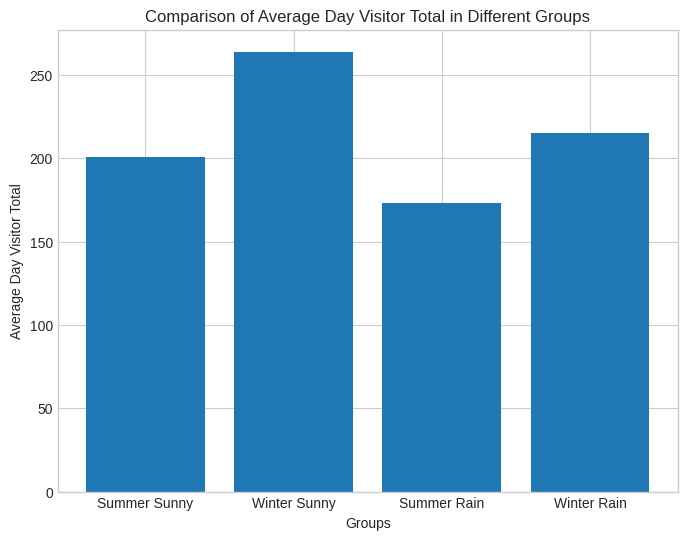

In [69]:
groups = ['Summer Sunny', 'Winter Sunny', 'Summer Rain', 'Winter Rain']

data = [summer_sun['DayvisitorTotal'].values[0], winter_sun['DayvisitorTotal'].values[0],
        summer_rain['DayvisitorTotal'].values[0], winter_rain['DayvisitorTotal'].values[0]]

plt.figure(figsize=(8, 6))
plt.bar(groups, data)
plt.xlabel('Groups')
plt.ylabel('Average Day Visitor Total')
plt.title('Comparison of Average Day Visitor Total in Different Groups')
plt.show()

## 3. COVID impact

## 3.1 COVID impact on visitor footfall 

Pre COVID - 2017-2020/3/23

Post COVID - 2021/04/11 - 2022

Conduct overall analysis (excluding the COVID period), but incorporating daily analysis after each lockdown to examine any changes in passionate tourism and consumption.


In [70]:
merged.head()

,Date,AdmissionsAD,AdmissionsCH,EducationAD,EducationCH,FamilyAD,FamilyCH,TicketFOCAD,TicketFOCCH,MembersAD,...,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,peak month,Weekday
0,2017-01-01,130.0,22,0,0,20,20,6,4,172,...,36.2,322.4,1018.3,84.8,17.5,11.6,1.1,1,0,Sunday
1,2017-01-02,334.0,90,3,8,84,84,37,2,630,...,28.6,35.5,1029.2,44.0,21.0,53.3,4.6,3,0,Monday
2,2017-01-03,162.0,46,23,72,30,30,17,7,320,...,19.3,299.6,1031.1,42.8,29.0,57.6,5.0,3,0,Tuesday
3,2017-01-04,100.0,18,12,26,4,4,7,2,124,...,23.3,314.7,1028.6,92.6,31.3,44.5,3.8,2,0,Wednesday
4,2017-01-05,97.0,6,19,107,6,6,9,0,210,...,14.3,100.8,1033.8,79.8,24.6,48.2,4.1,2,0,Thursday


In [71]:
precovid = merged.copy()

precovid = precovid[(precovid['Date'] <= '2020-03-22')]

postcovid = merged.copy()

postcovid = postcovid[(postcovid['Date'] >= '2021-04-12')]

precovid.reset_index(drop=True, inplace=True)
postcovid.reset_index(drop=True, inplace=True)


In [72]:
print(precovid.head())
print(postcovid.head())


        Date  AdmissionsAD  AdmissionsCH  EducationAD  EducationCH  FamilyAD  \
0 2017-01-01         130.0            22            0            0        20   
1 2017-01-02         334.0            90            3            8        84   
2 2017-01-03         162.0            46           23           72        30   
3 2017-01-04         100.0            18           12           26         4   
4 2017-01-05          97.0             6           19          107         6   

   FamilyCH  TicketFOCAD  TicketFOCCH  MembersAD  ...  windspeed  winddir  \
0        20            6            4        172  ...       36.2    322.4   
1        84           37            2        630  ...       28.6     35.5   
2        30           17            7        320  ...       19.3    299.6   
3         4            7            2        124  ...       23.3    314.7   
4         6            9            0        210  ...       14.3    100.8   

   sealevelpressure  cloudcover  visibility solarradiati

Extract the weather factor with the highest corr and visualise it in turn with the pre/post

In [73]:
len(postcovid), len(precovid),len(merged)

(629, 1177, 2191)

In [74]:
precovid['Day Visitor'] = precovid['AdmissionsAD']+precovid['AdmissionsCH']+precovid['EducationAD']+precovid['EducationCH']+precovid['FamilyAD'] + precovid['FamilyCH'] + precovid['TicketFOCAD'] + precovid['TicketFOCCH']
precovid = precovid.drop(['AdmissionsAD','AdmissionsCH','EducationAD','EducationCH','FamilyAD','FamilyCH','TicketFOCAD','TicketFOCCH'],axis=1)
precovid['Member'] = precovid['MembersAD'] + precovid['MembersCH']
precovid = precovid.drop(['MembersAD','MembersCH'],axis=1)


In [75]:
linear_data = precovid.copy()

In [76]:
linear_data = linear_data.drop(['Day Total',"Under 3's"],axis=1)

/tmp/ipykernel_131358/1729533185.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(year_data.corr())


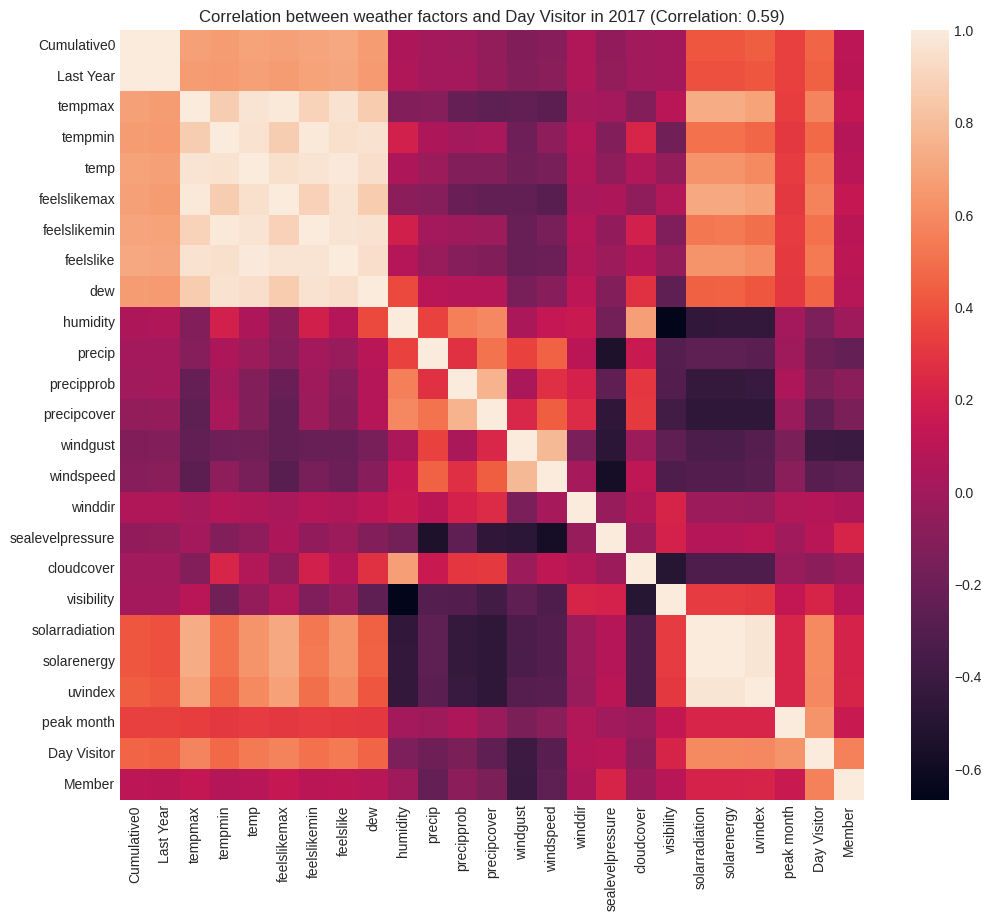

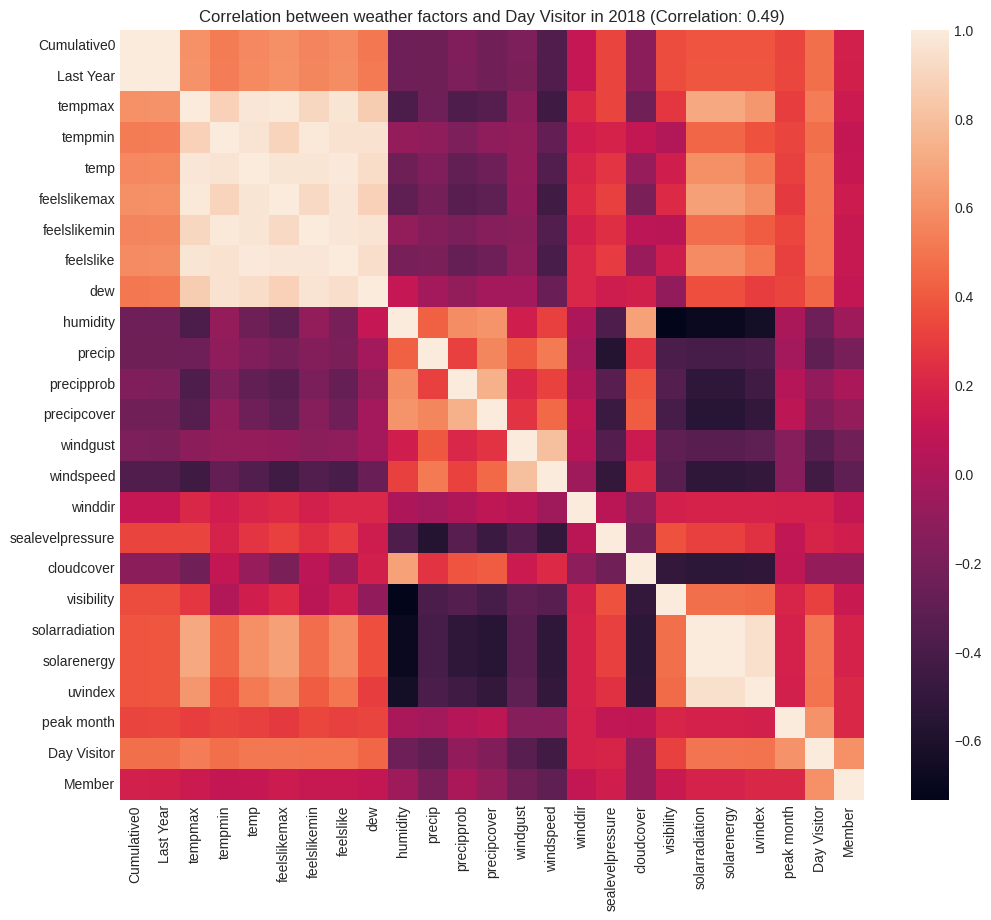

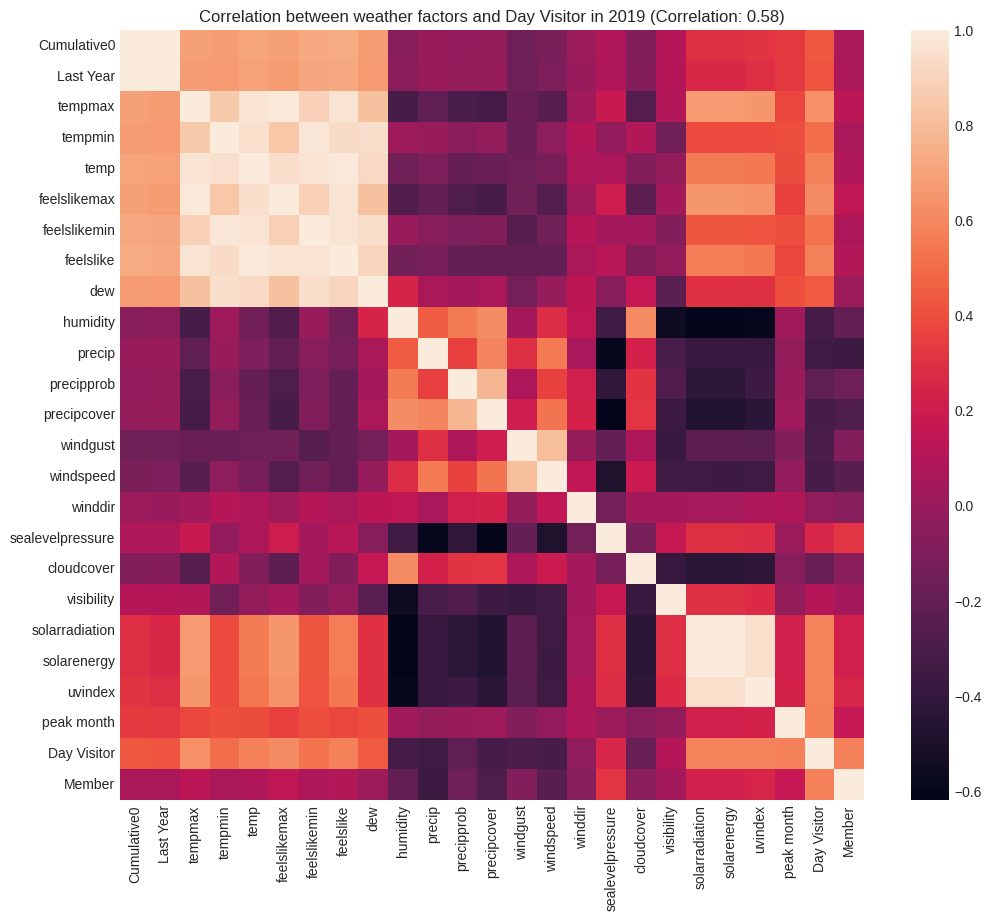

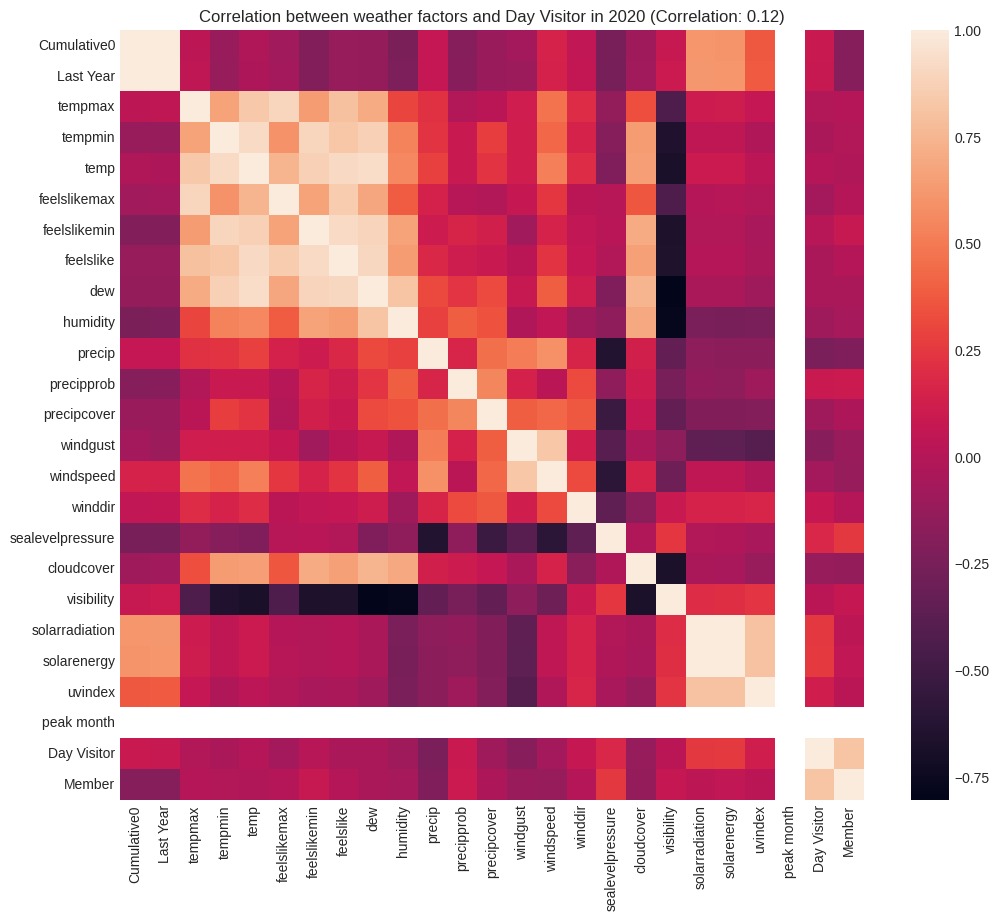

In [77]:
years = linear_data['Date'].dt.year.unique()
linear_data = linear_data.drop(['snow','snowdepth'], axis=1)
for year in years:
    year_data = linear_data[(linear_data['Date'].dt.year == year) & (linear_data[factor].notnull())]
    correlation = year_data['Day Visitor'].corr(year_data[factor])
    plt.figure(figsize=(12, 10))
    sns.heatmap(year_data.corr())
    plt.title('Correlation between weather factors and Day Visitor in {} (Correlation: {:.2f})'.format(year, correlation))
    plt.show()

In [78]:
factors = linear_data.columns
for year in years:
    year_data = linear_data[(linear_data['Date'].dt.year == year)]

    correlation = year_data.drop(['Member'],axis=1).corr()['Day Visitor'].sort_values(ascending=False)
    print(correlation)


Day Visitor         1.000000
peak month          0.632698
solarradiation      0.594770
solarenergy         0.594441
uvindex             0.585794
tempmax             0.575441
feelslikemax        0.564035
feelslike           0.533838
temp                0.531502
feelslikemin        0.503062
tempmin             0.474821
Cumulative0         0.454152
dew                 0.454136
Last Year           0.443963
visibility          0.222457
sealevelpressure    0.088864
winddir             0.081523
cloudcover         -0.080215
humidity           -0.135762
precipprob         -0.143738
precip             -0.198546
precipcover        -0.254800
windspeed          -0.282110
windgust           -0.396677
Name: Day Visitor, dtype: float64
Day Visitor         1.000000
peak month          0.613460
tempmax             0.529707
feelslikemax        0.511908
temp                0.508666
feelslike           0.504220
feelslikemin        0.502199
solarradiation      0.497190
solarenergy         0.496295
uvindex  

/tmp/ipykernel_131358/539810971.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = year_data.drop(['Member'],axis=1).corr()['Day Visitor'].sort_values(ascending=False)
/tmp/ipykernel_131358/539810971.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = year_data.drop(['Member'],axis=1).corr()['Day Visitor'].sort_values(ascending=False)
/tmp/ipykernel_131358/539810971.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = year_data.drop(['

# 5. Special dates Analysis

Got the dates for Bank holidays which would have peak visitor footfall in the zoo (require confirmation) 

Bank holidays from 2017 to 2022:
(Exclude zoo closed date)

2017/01/01

2017/04/14

2017/05/01

2017/05/29

2017/12/26

2018/01/01

2018/03/30

2018/05/07

2018/05/28

2018/12/26

2019/01/01

2019/04/19

2019/05/06

2019/05/27

2019/12/26

2020/01/01

2020/12/28

2021/01/01

2021/05/02

2021/05/31

2021/12/27

2021/12/28

2022/01/01

2022/01/03

2022/04/15

2022/05/02

2022/06/02

2022/06/03

2022/12/26

2022/12/27



In [79]:
bank_holidays = [
    '2017/01/01', '2017/04/14', '2017/05/01', '2017/05/29', '2017/12/26',
    '2018/01/01', '2018/03/30', '2018/05/07', '2018/05/28', '2018/12/26',
    '2019/01/01', '2019/04/19', '2019/05/06', '2019/05/27', '2019/12/26',
    '2020/01/01', '2020/12/28', '2021/01/01', '2021/05/02', '2021/05/31',
    '2021/12/27', '2021/12/28', '2022/01/01', '2022/01/03', '2022/04/15',
    '2022/05/02', '2022/06/02', '2022/06/03', '2022/12/26', '2022/12/27'
]

In [80]:
analysis_data = linear_data.copy()
analysis_data.head()

,Date,Cumulative0,Last Year,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,peak month,Weekday,Day Visitor,Member
0,2017-01-01,31703.0,22520.0,2017-01-01,8.4,3.4,6.2,5.1,-2.5,2.2,...,1018.3,84.8,17.5,11.6,1.1,1,0,Sunday,202.0,246
1,2017-01-02,33313.0,23356.0,2017-01-02,5.0,-0.5,2.5,1.1,-3.4,-1.6,...,1029.2,44.0,21.0,53.3,4.6,3,0,Monday,642.0,968
2,2017-01-03,34223.0,23847.0,2017-01-03,5.7,-1.0,2.4,3.3,-3.4,-0.2,...,1031.1,42.8,29.0,57.6,5.0,3,0,Tuesday,387.0,523
3,2017-01-04,34559.0,24368.0,2017-01-04,7.1,4.3,5.6,5.1,0.1,2.7,...,1028.6,92.6,31.3,44.5,3.8,2,0,Wednesday,173.0,163
4,2017-01-05,35056.0,24630.0,2017-01-05,5.9,2.2,3.8,3.1,-1.1,0.9,...,1033.8,79.8,24.6,48.2,4.1,2,0,Thursday,250.0,247


In [81]:
analysis_data = analysis_data[['Date','Day Visitor','Member']]
analysis_data['Date']=pd.to_datetime(analysis_data['Date'])

In [82]:
bank_holiday_data = analysis_data[analysis_data['Date'].isin(bank_holidays)]
bank_holiday_data

,Date,Day Visitor,Member
0,2017-01-01,202.0,246
103,2017-04-14,2516.0,899
120,2017-05-01,764.0,719
148,2017-05-29,2580.0,825
359,2017-12-26,120.0,109
365,2018-01-01,232.0,481
453,2018-03-30,797.0,537
491,2018-05-07,1829.0,637
512,2018-05-28,2567.0,642
724,2018-12-26,247.0,191


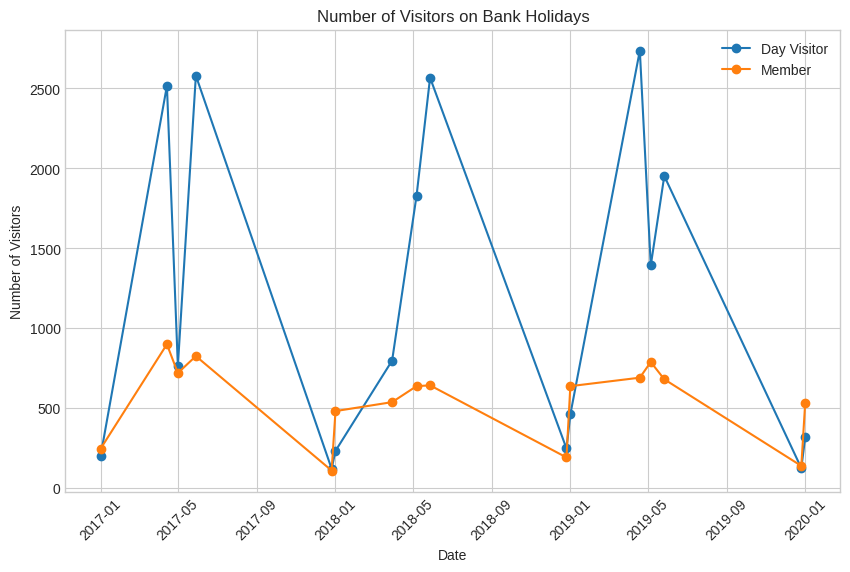

In [83]:
plt.figure(figsize=(10, 6))
plt.plot(bank_holiday_data['Date'], bank_holiday_data['Day Visitor'], marker='o', label='Day Visitor')
plt.plot(bank_holiday_data['Date'], bank_holiday_data['Member'], marker='o', label='Member')
plt.xlabel('Date')
plt.ylabel('Number of Visitors')
plt.title('Number of Visitors on Bank Holidays')
plt.xticks(rotation=45)
plt.legend()
plt.show()

Cannot get the specific date periods for school holidays, date ranges are too big to put into the overall data, therefore decided to use Bank Holidays only

# 6. Prediction Model - visitor footfall

In [84]:
merged['isWeekend'] = merged['Date'].dt.weekday.apply(lambda x: 1 if x in [5, 6] else 0)
merged['isBankHoliday'] =merged['Date'].apply(lambda x: 1 if x in bank_holidays else 0)

In [85]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2191 entries, 0 to 2190
Data columns (total 43 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   Date              2191 non-null   datetime64[ns]
 1   AdmissionsAD      2191 non-null   float64       
 2   AdmissionsCH      2191 non-null   int64         
 3   EducationAD       2191 non-null   int64         
 4   EducationCH       2191 non-null   int64         
 5   FamilyAD          2191 non-null   int64         
 6   FamilyCH          2191 non-null   int64         
 7   TicketFOCAD       2191 non-null   int64         
 8   TicketFOCCH       2191 non-null   int64         
 9   MembersAD         2191 non-null   int64         
 10  MembersCH         2191 non-null   int64         
 11  Day Total         2190 non-null   float64       
 12  Cumulative0       2191 non-null   float64       
 13  Last Year         2191 non-null   float64       
 14  Under 3's         4 non-

### Linear Regression

In [86]:
linear_data = merged.copy()
linear_data['Day Visitor'] = linear_data['AdmissionsAD']+linear_data['AdmissionsCH']+linear_data['EducationAD']+linear_data['EducationCH']+linear_data['FamilyAD'] + linear_data['FamilyCH'] + linear_data['TicketFOCAD'] + linear_data['TicketFOCCH']
linear_data = linear_data.drop(['AdmissionsAD','AdmissionsCH','EducationAD','EducationCH','FamilyAD','FamilyCH','TicketFOCAD','TicketFOCCH'],axis=1)
linear_data['Member'] = linear_data['MembersAD'] + linear_data['MembersCH']
linear_data = linear_data.drop(['MembersAD','MembersCH'],axis=1)

In [87]:
linear_data = linear_data.drop(["Under 3's",'datetime'],axis=1)
linear_data

,Date,Day Total,Cumulative0,Last Year,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,...,visibility,solarradiation,solarenergy,uvindex,peak month,Weekday,isWeekend,isBankHoliday,Day Visitor,Member
0,2017-01-01,448.0,31703.0,22520.0,8.4,3.4,6.2,5.1,-2.5,2.2,...,17.5,11.6,1.1,1,0,Sunday,1,0,202.0,246
1,2017-01-02,1610.0,33313.0,23356.0,5.0,-0.5,2.5,1.1,-3.4,-1.6,...,21.0,53.3,4.6,3,0,Monday,0,0,642.0,968
2,2017-01-03,910.0,34223.0,23847.0,5.7,-1.0,2.4,3.3,-3.4,-0.2,...,29.0,57.6,5.0,3,0,Tuesday,0,0,387.0,523
3,2017-01-04,336.0,34559.0,24368.0,7.1,4.3,5.6,5.1,0.1,2.7,...,31.3,44.5,3.8,2,0,Wednesday,0,0,173.0,163
4,2017-01-05,497.0,35056.0,24630.0,5.9,2.2,3.8,3.1,-1.1,0.9,...,24.6,48.2,4.1,2,0,Thursday,0,0,250.0,247
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,2022-12-27,418.0,22688.0,23522.0,10.4,5.6,8.3,10.4,1.8,4.8,...,16.0,56.4,2.0,1,0,Tuesday,0,0,160.0,258
2187,2022-12-28,233.0,22921.0,24589.0,11.2,8.6,9.8,11.2,4.2,7.0,...,10.4,30.6,0.9,1,0,Wednesday,0,0,131.0,102
2188,2022-12-29,887.0,23808.0,25212.0,8.8,6.3,7.3,4.2,1.7,3.1,...,18.5,66.5,2.3,2,0,Thursday,0,0,367.0,520
2189,2022-12-30,452.0,24260.0,25975.0,11.2,8.3,9.8,11.2,4.0,7.3,...,16.1,52.4,1.6,1,0,Friday,0,0,208.0,244


In [88]:
linear_data['windgust'] = linear_data['windgust'].fillna(0)
linear_data['windgust'] = linear_data['windgust'].replace(np.nan, 0)
linear_data['preciptype'] = linear_data['preciptype'].fillna(0)
linear_data['preciptype'] = linear_data['preciptype'].replace('rain',1)
linear_data['preciptype'] = linear_data['preciptype'].replace('snow',2)
linear_data['preciptype'] = linear_data['preciptype'].replace('rain,snow',3)

In [89]:
linear_data['Weekday'] = linear_data['Date'].apply(lambda x: x.weekday())
linear_data['Month'] = linear_data['Date'].dt.month
linear_data['Year'] = linear_data['Date'].dt.year
linear_data['Season'] = linear_data['Month'].apply(lambda x: 1 if x in [3,4,5] else (2 if x in [6,7,8] else (3 if x in [9,10,11] else 4)))
linear_data = linear_data.drop(['Date'],axis=1)
linear_data.head()


,Day Total,Cumulative0,Last Year,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,...,uvindex,peak month,Weekday,isWeekend,isBankHoliday,Day Visitor,Member,Month,Year,Season
0,448.0,31703.0,22520.0,8.4,3.4,6.2,5.1,-2.5,2.2,5.3,...,1,0,6,1,0,202.0,246,1,2017,4
1,1610.0,33313.0,23356.0,5.0,-0.5,2.5,1.1,-3.4,-1.6,0.0,...,3,0,0,0,0,642.0,968,1,2017,4
2,910.0,34223.0,23847.0,5.7,-1.0,2.4,3.3,-3.4,-0.2,0.2,...,3,0,1,0,0,387.0,523,1,2017,4
3,336.0,34559.0,24368.0,7.1,4.3,5.6,5.1,0.1,2.7,3.3,...,2,0,2,0,0,173.0,163,1,2017,4
4,497.0,35056.0,24630.0,5.9,2.2,3.8,3.1,-1.1,0.9,0.3,...,2,0,3,0,0,250.0,247,1,2017,4


In [90]:
linear_data = linear_data.drop(['Day Total'],axis=1)

In [91]:
#scale 
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.model_selection import train_test_split
y_scaler = StandardScaler()
x_scaler = MinMaxScaler()

from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error

In [92]:
x_day_visitor = linear_data.drop(['Day Visitor','Member'],axis=1)
y_day_visitor = linear_data[['Day Visitor']]

# Standardise
y_day_visitor = y_scaler.fit_transform(y_day_visitor)
x_day_visitor = x_scaler.fit_transform(x_day_visitor)

# Split the dataset 
x_train_day_visitor, x_test_day_visitor, y_train_day_visitor, y_test_day_visitor = train_test_split(x_day_visitor, y_day_visitor, test_size=0.2, random_state=42)

lasso_day_visitor = Lasso(alpha=0.1)
lasso_day_visitor.fit(x_train_day_visitor, y_train_day_visitor)

y_pred_day_visitor = lasso_day_visitor.predict(x_test_day_visitor)
print("Day Visitor Lasso MSE:", mean_squared_error(y_test_day_visitor, y_pred_day_visitor))


Day Visitor Lasso MSE: 0.703435952648137


In [93]:
x_member = linear_data.drop(['Day Visitor','Member'],axis=1)
y_member = linear_data[['Member']]

# Standardise
y_member = y_scaler.fit_transform(y_member)
x_member = x_scaler.fit_transform(x_member)

# Split the dataset 
x_train_member, x_test_member, y_train_member, y_test_member = train_test_split(x_member, y_member, test_size=0.2, random_state=42)

lasso_member = Lasso(alpha=0.1)
lasso_member.fit(x_train_member, y_train_member)


y_pred_member = lasso_member.predict(x_test_member)
print("Members Lasso MSE:", mean_squared_error(y_test_member, y_pred_member))


Members Lasso MSE: 0.8721553847655693


### Decision Tree

In [94]:
from sklearn.tree import DecisionTreeRegressor

model_day_visitor = DecisionTreeRegressor(random_state=42)
model_day_visitor.fit(x_train_day_visitor, y_train_day_visitor)
y_pred_day_visitor = model_day_visitor.predict(x_test_day_visitor)

print("Day Visitors Decision Tree MSE:", mean_squared_error(y_test_day_visitor, y_pred_day_visitor))


Day Visitors Decision Tree MSE: 0.34495769914771085


In [95]:
model_member = DecisionTreeRegressor(random_state=42)
model_member.fit(x_train_member, y_train_member)
y_pred_member = model_member.predict(x_test_member)

print("Members Decision Tree MSE:", mean_squared_error(y_test_member, y_pred_member))


Members Decision Tree MSE: 0.6828032714205001


### Random Forest

In [96]:
from sklearn.ensemble import RandomForestRegressor

model_day_visitor = RandomForestRegressor(random_state=42)
model_day_visitor.fit(x_train_day_visitor, y_train_day_visitor.ravel())
y_pred_day_visitor = model_day_visitor.predict(x_test_day_visitor)

print("Day Visitors Random Forest MSE:", mean_squared_error(y_test_day_visitor, y_pred_day_visitor))


Day Visitors Random Forest MSE: 0.1878093041649154


In [97]:
model_member = RandomForestRegressor(random_state=42)
model_member.fit(x_train_member, y_train_member.ravel())
y_pred_member = model_member.predict(x_test_member)

print("Members Random Forest MSE:", mean_squared_error(y_test_member, y_pred_member))


Members Random Forest MSE: 0.3544013150723781


### LSTM

In [98]:
lstm_data = linear_data.copy()
#delete the data which is not in the zoo open time
lstm_data = lstm_data[(lstm_data['Day Visitor'] != 0) & (lstm_data['Member'] != 0)]
lstm_data

,Cumulative0,Last Year,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,uvindex,peak month,Weekday,isWeekend,isBankHoliday,Day Visitor,Member,Month,Year,Season
0,31703.0,22520.0,8.4,3.4,6.2,5.1,-2.5,2.2,5.3,93.7,...,1,0,6,1,0,202.0,246,1,2017,4
1,33313.0,23356.0,5.0,-0.5,2.5,1.1,-3.4,-1.6,0.0,83.2,...,3,0,0,0,0,642.0,968,1,2017,4
2,34223.0,23847.0,5.7,-1.0,2.4,3.3,-3.4,-0.2,0.2,85.4,...,3,0,1,0,0,387.0,523,1,2017,4
3,34559.0,24368.0,7.1,4.3,5.6,5.1,0.1,2.7,3.3,85.1,...,2,0,2,0,0,173.0,163,1,2017,4
4,35056.0,24630.0,5.9,2.2,3.8,3.1,-1.1,0.9,0.3,78.1,...,2,0,3,0,0,250.0,247,1,2017,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2186,22688.0,23522.0,10.4,5.6,8.3,10.4,1.8,4.8,7.0,92.1,...,1,0,1,0,0,160.0,258,12,2022,4
2187,22921.0,24589.0,11.2,8.6,9.8,11.2,4.2,7.0,8.8,93.7,...,1,0,2,0,0,131.0,102,12,2022,4
2188,23808.0,25212.0,8.8,6.3,7.3,4.2,1.7,3.1,5.3,87.1,...,2,0,3,0,0,367.0,520,12,2022,4
2189,24260.0,25975.0,11.2,8.3,9.8,11.2,4.0,7.3,8.7,93.1,...,1,0,4,0,0,208.0,244,12,2022,4


In [99]:
lstm_data = lstm_data.reset_index(drop=True)
lstm_data

,Cumulative0,Last Year,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,uvindex,peak month,Weekday,isWeekend,isBankHoliday,Day Visitor,Member,Month,Year,Season
0,31703.0,22520.0,8.4,3.4,6.2,5.1,-2.5,2.2,5.3,93.7,...,1,0,6,1,0,202.0,246,1,2017,4
1,33313.0,23356.0,5.0,-0.5,2.5,1.1,-3.4,-1.6,0.0,83.2,...,3,0,0,0,0,642.0,968,1,2017,4
2,34223.0,23847.0,5.7,-1.0,2.4,3.3,-3.4,-0.2,0.2,85.4,...,3,0,1,0,0,387.0,523,1,2017,4
3,34559.0,24368.0,7.1,4.3,5.6,5.1,0.1,2.7,3.3,85.1,...,2,0,2,0,0,173.0,163,1,2017,4
4,35056.0,24630.0,5.9,2.2,3.8,3.1,-1.1,0.9,0.3,78.1,...,2,0,3,0,0,250.0,247,1,2017,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1910,22688.0,23522.0,10.4,5.6,8.3,10.4,1.8,4.8,7.0,92.1,...,1,0,1,0,0,160.0,258,12,2022,4
1911,22921.0,24589.0,11.2,8.6,9.8,11.2,4.2,7.0,8.8,93.7,...,1,0,2,0,0,131.0,102,12,2022,4
1912,23808.0,25212.0,8.8,6.3,7.3,4.2,1.7,3.1,5.3,87.1,...,2,0,3,0,0,367.0,520,12,2022,4
1913,24260.0,25975.0,11.2,8.3,9.8,11.2,4.0,7.3,8.7,93.1,...,1,0,4,0,0,208.0,244,12,2022,4


In [100]:
import tensorflow as tf
lstm_x_day_visitor = lstm_data.drop(['Day Visitor'],axis=1)
lstm_y_day_visitor = lstm_data[['Day Visitor']]

lstm_x_day_visitor = x_scaler.fit_transform(lstm_x_day_visitor)
lstm_y_day_visitor = y_scaler.fit_transform(lstm_y_day_visitor)

timeSequence = 7

def create_sequences(x, y, time_steps):#create the sequences
    x_seq, y_seq = [], []
    for i in range(len(x) - time_steps):
        x_seq.append(x[i:i+time_steps])
        y_seq.append(y[i+time_steps])
    return np.array(x_seq), np.array(y_seq)

lstm_x_day_visitor,lstm_y_day_visitor = create_sequences(lstm_x_day_visitor, lstm_y_day_visitor, timeSequence)

lstm_x_train_day_visitor, lstm_x_test_day_visitor, lstm_y_train_day_visitor, lstm_y_test_day_visitor = train_test_split(lstm_x_day_visitor, lstm_y_day_visitor, test_size=0.2, random_state=42)

def lstmModel_day_visitor():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.LSTM(128, input_shape=(timeSequence, lstm_x_day_visitor.shape[2]), return_sequences=True))
    model.add(tf.keras.layers.LSTM(128, return_sequences=False))
    model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=[tf.keras.metrics.MeanSquaredError()])
    return model

lstm_Model_day_visitor = lstmModel_day_visitor()
lstm_Model_day_visitor.summary()
lstm_Model_day_visitor.fit(lstm_x_train_day_visitor, lstm_y_train_day_visitor,validation_data=(lstm_x_test_day_visitor, lstm_y_test_day_visitor),epochs=100,verbose=1)


2023-08-05 16:30:25.822056: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/anaconda/envs/Python3/lib:
2023-08-05 16:30:25.822088: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-08-05 16:30:27.285615: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/anaconda/envs/Python3/lib:
2023-08-05 16:30:27.285654: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2023-08-05 16:30:27.285674: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (cube-dbffb37d-ee93-418

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 7, 128)            82944     
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 214,657
Trainable params: 214,657
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
48/48 [==============================] - 6s 71ms/step - loss: 0.6268 - mean_squared_error: 0.6268 - val_loss: 0.3821 - val_mean_squared_error: 0.3821
Epoch 2/100
48/48 [=

48/48 [==============================] - 3s 53ms/step - loss: 0.1368 - mean_squared_error: 0.1368 - val_loss: 0.1839 - val_mean_squared_error: 0.1839
Epoch 46/100
48/48 [==============================] - 3s 54ms/step - loss: 0.1321 - mean_squared_error: 0.1321 - val_loss: 0.1876 - val_mean_squared_error: 0.1876
Epoch 47/100
48/48 [==============================] - 3s 55ms/step - loss: 0.1374 - mean_squared_error: 0.1374 - val_loss: 0.1996 - val_mean_squared_error: 0.1996
Epoch 48/100
48/48 [==============================] - 3s 55ms/step - loss: 0.1276 - mean_squared_error: 0.1276 - val_loss: 0.1964 - val_mean_squared_error: 0.1964
Epoch 49/100
48/48 [==============================] - 3s 55ms/step - loss: 0.1265 - mean_squared_error: 0.1265 - val_loss: 0.1989 - val_mean_squared_error: 0.1989
Epoch 50/100
48/48 [==============================] - 3s 53ms/step - loss: 0.1287 - mean_squared_error: 0.1287 - val_loss: 0.1845 - val_mean_squared_error: 0.1845
Epoch 51/100
48/48 [===============

48/48 [==============================] - 3s 53ms/step - loss: 0.0335 - mean_squared_error: 0.0335 - val_loss: 0.1892 - val_mean_squared_error: 0.1892
Epoch 96/100
48/48 [==============================] - 3s 53ms/step - loss: 0.0302 - mean_squared_error: 0.0302 - val_loss: 0.2214 - val_mean_squared_error: 0.2214
Epoch 97/100
48/48 [==============================] - 3s 55ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.2124 - val_mean_squared_error: 0.2124
Epoch 98/100
48/48 [==============================] - 3s 55ms/step - loss: 0.0277 - mean_squared_error: 0.0277 - val_loss: 0.1940 - val_mean_squared_error: 0.1940
Epoch 99/100
48/48 [==============================] - 3s 53ms/step - loss: 0.0285 - mean_squared_error: 0.0285 - val_loss: 0.1953 - val_mean_squared_error: 0.1953
Epoch 100/100
48/48 [==============================] - 3s 53ms/step - loss: 0.0291 - mean_squared_error: 0.0291 - val_loss: 0.2055 - val_mean_squared_error: 0.2055


In [101]:
lstm_x_member = lstm_data.drop(['Member'],axis=1)
lstm_y_member = lstm_data[['Member']]

lstm_x_member = x_scaler.fit_transform(lstm_x_member)
lstm_y_member = y_scaler.fit_transform(lstm_y_member)

timeSequence = 7

def create_sequences(x, y, time_steps):#create the sequences
    x_seq, y_seq = [], []
    for i in range(len(x) - time_steps):
        x_seq.append(x[i:i+time_steps])
        y_seq.append(y[i+time_steps])
    return np.array(x_seq), np.array(y_seq)

lstm_x_member,lstm_y_member = create_sequences(lstm_x_member, lstm_y_member, timeSequence)

lstm_x_train_member, lstm_x_test_member, lstm_y_train_member, lstm_y_test_member = train_test_split(lstm_x_member, lstm_y_member, test_size=0.2, random_state=42)

def lstmModel_member():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.LSTM(128, input_shape=(timeSequence, lstm_x_member.shape[2]), return_sequences=True))
    model.add(tf.keras.layers.LSTM(128, return_sequences=False))
    model.add(tf.keras.layers.Dropout(0.2))
    model.add(tf.keras.layers.Dense(1))
    model.compile(optimizer='adam', loss='mse', metrics=[tf.keras.metrics.MeanSquaredError()])
    return model

lstm_Model_member = lstmModel_member()
lstm_Model_member.summary()
lstm_Model_member.fit(lstm_x_train_member, lstm_y_train_member,validation_data=(lstm_x_test_member, lstm_y_test_member),epochs=100,verbose=1)


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 7, 128)            82944     
                                                                 
 lstm_3 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 214,657
Trainable params: 214,657
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
48/48 [==============================] - 6s 75ms/step - loss: 0.9916 - mean_squared_error: 0.9916 - val_loss: 0.8137 - val_mean_squared_error: 0.8137
Epoch 2/100
48/48 

48/48 [==============================] - 3s 55ms/step - loss: 0.2239 - mean_squared_error: 0.2239 - val_loss: 0.4114 - val_mean_squared_error: 0.4114
Epoch 46/100
48/48 [==============================] - 3s 55ms/step - loss: 0.2071 - mean_squared_error: 0.2071 - val_loss: 0.3894 - val_mean_squared_error: 0.3894
Epoch 47/100
48/48 [==============================] - 3s 55ms/step - loss: 0.2095 - mean_squared_error: 0.2095 - val_loss: 0.4345 - val_mean_squared_error: 0.4345
Epoch 48/100
48/48 [==============================] - 3s 55ms/step - loss: 0.1903 - mean_squared_error: 0.1903 - val_loss: 0.3772 - val_mean_squared_error: 0.3772
Epoch 49/100
48/48 [==============================] - 3s 55ms/step - loss: 0.2098 - mean_squared_error: 0.2098 - val_loss: 0.4104 - val_mean_squared_error: 0.4104
Epoch 50/100
48/48 [==============================] - 3s 55ms/step - loss: 0.1890 - mean_squared_error: 0.1890 - val_loss: 0.4087 - val_mean_squared_error: 0.4087
Epoch 51/100
48/48 [===============

48/48 [==============================] - 3s 53ms/step - loss: 0.0433 - mean_squared_error: 0.0433 - val_loss: 0.3968 - val_mean_squared_error: 0.3968
Epoch 96/100
48/48 [==============================] - 3s 54ms/step - loss: 0.0438 - mean_squared_error: 0.0438 - val_loss: 0.4136 - val_mean_squared_error: 0.4136
Epoch 97/100
48/48 [==============================] - 3s 53ms/step - loss: 0.0372 - mean_squared_error: 0.0372 - val_loss: 0.4144 - val_mean_squared_error: 0.4144
Epoch 98/100
48/48 [==============================] - 3s 56ms/step - loss: 0.0371 - mean_squared_error: 0.0371 - val_loss: 0.4126 - val_mean_squared_error: 0.4126
Epoch 99/100
48/48 [==============================] - 3s 56ms/step - loss: 0.0432 - mean_squared_error: 0.0432 - val_loss: 0.4314 - val_mean_squared_error: 0.4314
Epoch 100/100
48/48 [==============================] - 3s 55ms/step - loss: 0.0407 - mean_squared_error: 0.0407 - val_loss: 0.4021 - val_mean_squared_error: 0.4021
